## Assignment 3: Generative Model

# Part I - Generative Adversarial Networks (GANs)
So far in DS6050, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__.
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](https://github.com/dscer/DS6050_Assignment_3/blob/main/gan_outputs_tf.png?raw=1)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy.


**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1].

In [4]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data

        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B))

11490434/11490434 [==============================] - 0s 0us/step


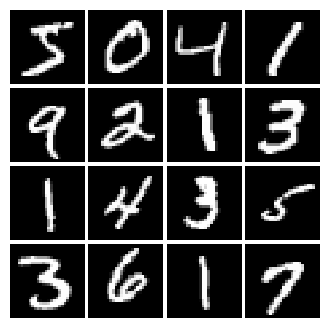

In [5]:
# show a batch
mnist = MNIST(batch_size=16)
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [6]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.

    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU

    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha * x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [7]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [8]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.

    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate

    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform(shape=(batch_size, dim), minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [9]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")

test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1

The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [54]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # Fully connected layer with input size 784 and output size 256
        tf.keras.layers.Dense(256, input_shape=(784,)),

        # LeakyReLU with alpha 0.01
        tf.keras.layers.LeakyReLU(0.01),

        # Fully connected layer with output size 256
        tf.keras.layers.Dense(256),

        # LeakyReLU with alpha 0.01
        tf.keras.layers.LeakyReLU(0.01),

        # Fully connected layer with output size 1
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [55]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')

test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with input size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [56]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # Fully connected layer with input size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),

        # ReLU
        tf.keras.layers.ReLU(),

        # Fully connected layer with output size 1024
        tf.keras.layers.Dense(1024),

        # ReLU
        tf.keras.layers.ReLU(),

        # Fully connected layer with output size 784
        tf.keras.layers.Dense(784),

        # TanH (To restrict every element of the output to be in the range [-1,1])
        tf.keras.layers.Activation('tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [57]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')

test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [58]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.

    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(logits_real), logits_real)
    fake_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [59]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [60]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z).

In [61]:
# TODO: create an AdamOptimizer for D_optimizer and G_optimizer
def get_optimizers(learning_rate=1e-3, beta1=0.5):
    """Create optimizer for GAN training.

    Inputs:
    - learning_rate: learning rate to use for both optimizer
    - beta1: beta1 parameter for both optimizer (first moment decay)

    Returns:
    - D_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_optimizer = None
    G_optimizer = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_optimizer = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_optimizer = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_optimizer, G_optimizer

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other.

In [18]:
# a giant helper function
def run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_optimizer: an Optimizer for Discriminator
    - G_optimizer: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)

    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)
                D_optimizer.apply_gradients(zip(d_gradients, D.trainable_variables))

            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)
                G_optimizer.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1

    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Instructions for updating:
Use tf.identity with explicit device placement instead.


Epoch: 0, Iter: 0, D: 1.052, G:0.7313


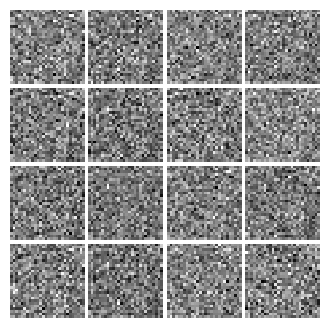

Epoch: 0, Iter: 20, D: 0.5764, G:0.9864


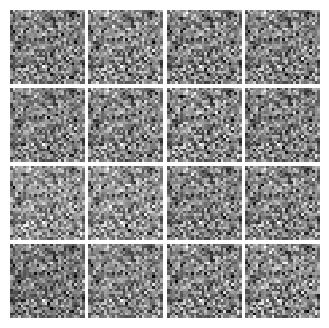

Epoch: 0, Iter: 40, D: 0.6956, G:1.521


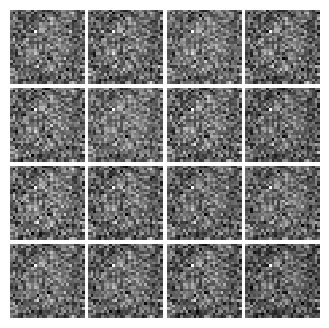

Epoch: 0, Iter: 60, D: 1.293, G:1.656


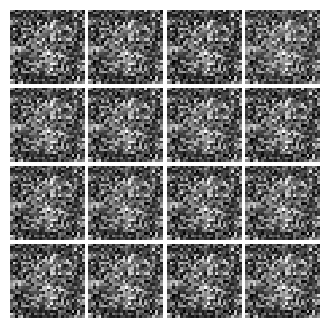

Epoch: 0, Iter: 80, D: 0.9378, G:1.335


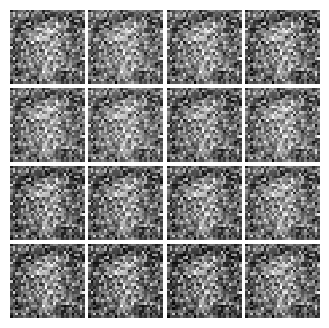

Epoch: 0, Iter: 100, D: 1.493, G:1.105


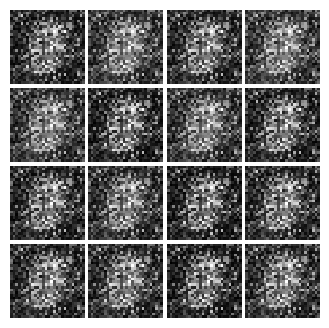

Epoch: 0, Iter: 120, D: 2.28, G:0.5807


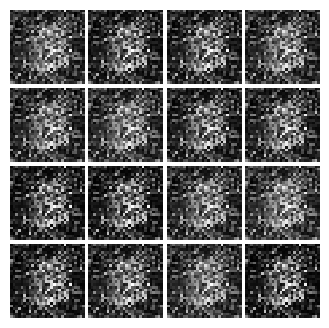

Epoch: 0, Iter: 140, D: 0.8113, G:1.864


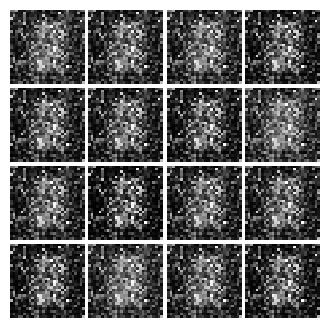

Epoch: 0, Iter: 160, D: 1.801, G:2.259


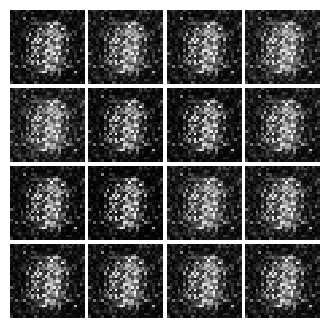

Epoch: 0, Iter: 180, D: 1.428, G:1.077


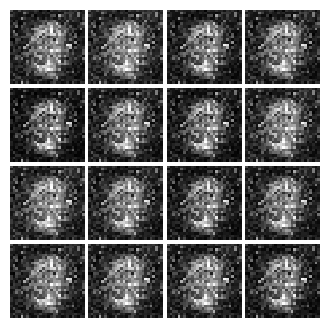

Epoch: 0, Iter: 200, D: 1.521, G:1.241


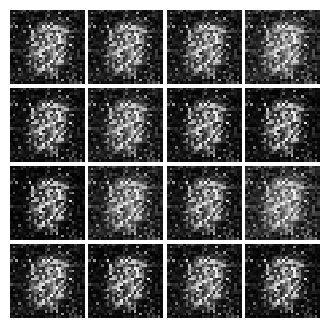

Epoch: 0, Iter: 220, D: 0.9739, G:1.211


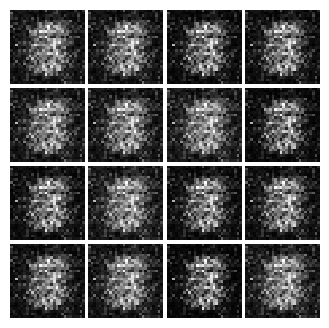

Epoch: 0, Iter: 240, D: 0.8815, G:1.098


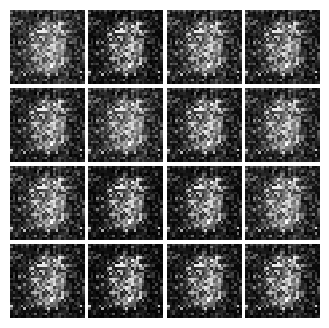

Epoch: 0, Iter: 260, D: 1.046, G:1.671


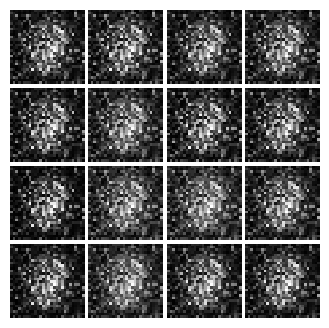

Epoch: 0, Iter: 280, D: 1.843, G:1.118


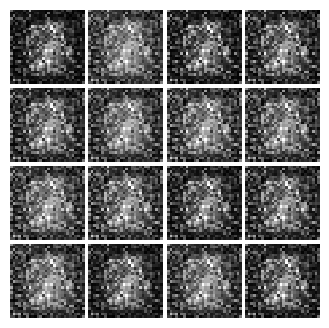

Epoch: 0, Iter: 300, D: 1.638, G:1.569


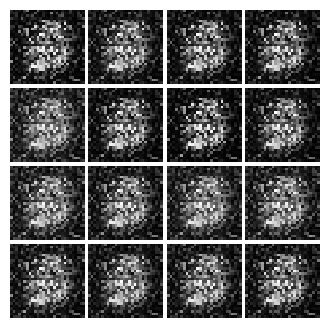

Epoch: 0, Iter: 320, D: 1.206, G:1.261


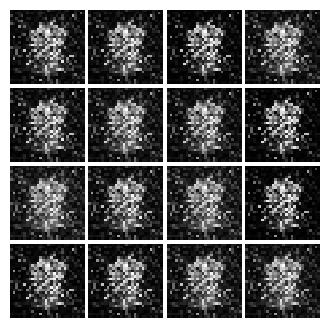

Epoch: 0, Iter: 340, D: 1.639, G:1.121


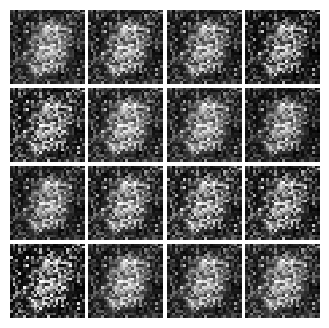

Epoch: 0, Iter: 360, D: 1.377, G:1.905


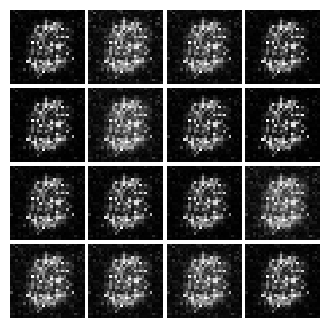

Epoch: 0, Iter: 380, D: 1.031, G:1.24


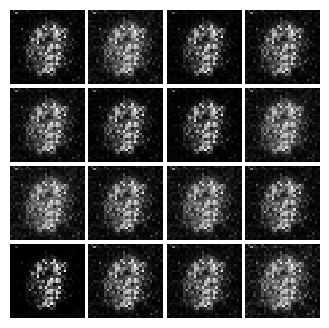

Epoch: 0, Iter: 400, D: 0.9879, G:3.785


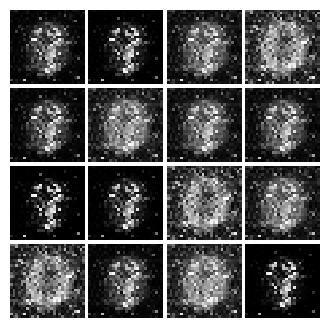

Epoch: 0, Iter: 420, D: 1.526, G:0.2026


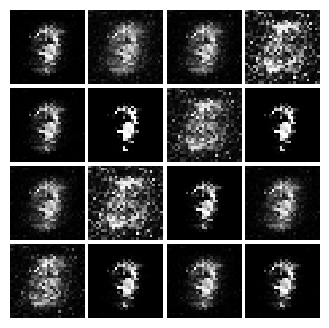

Epoch: 0, Iter: 440, D: 1.7, G:0.9566


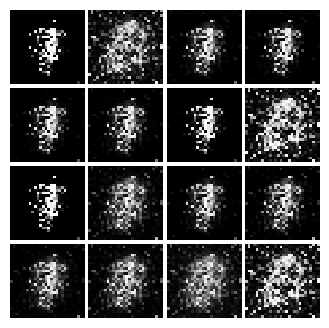

Epoch: 0, Iter: 460, D: 1.181, G:1.758


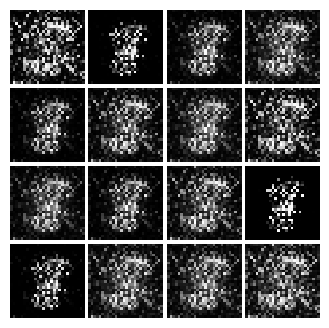

Epoch: 1, Iter: 480, D: 1.325, G:1.006


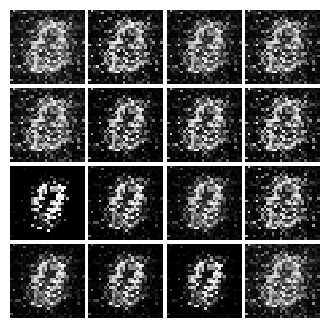

Epoch: 1, Iter: 500, D: 1.054, G:1.414


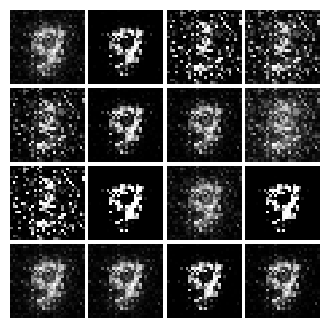

Epoch: 1, Iter: 520, D: 0.7668, G:1.513


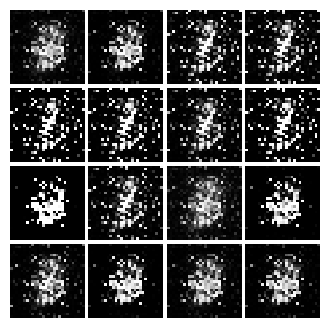

Epoch: 1, Iter: 540, D: 1.277, G:2.646


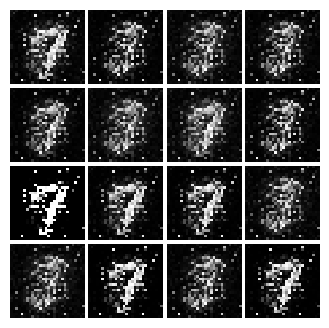

Epoch: 1, Iter: 560, D: 1.415, G:1.335


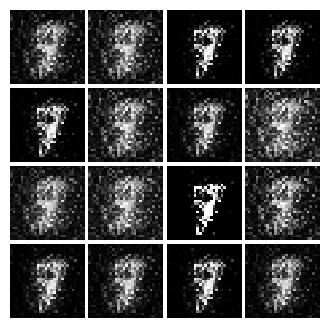

Epoch: 1, Iter: 580, D: 0.8187, G:1.431


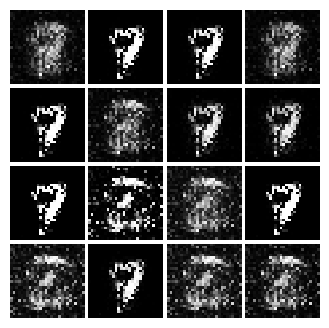

Epoch: 1, Iter: 600, D: 1.033, G:1.326


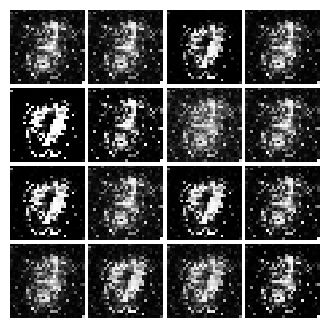

Epoch: 1, Iter: 620, D: 1.619, G:1.046


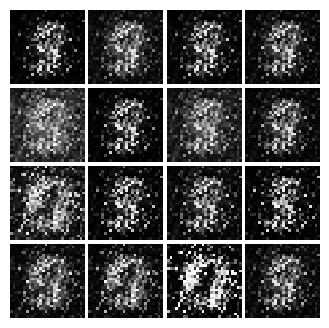

Epoch: 1, Iter: 640, D: 0.9733, G:0.9756


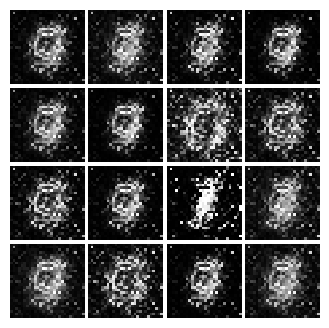

Epoch: 1, Iter: 660, D: 1.348, G:1.081


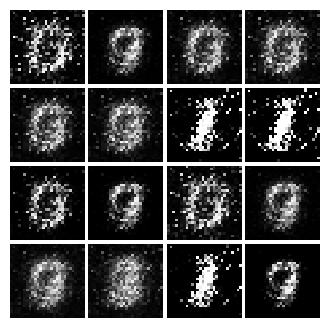

Epoch: 1, Iter: 680, D: 0.7215, G:1.601


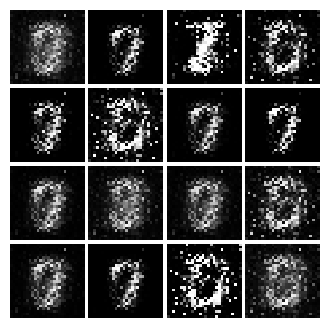

Epoch: 1, Iter: 700, D: 1.064, G:1.479


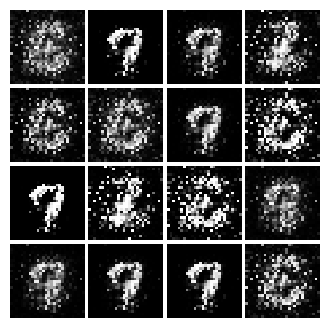

Epoch: 1, Iter: 720, D: 1.386, G:1.706


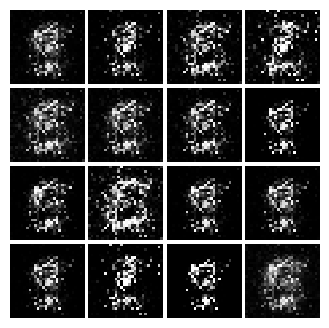

Epoch: 1, Iter: 740, D: 1.584, G:1.405


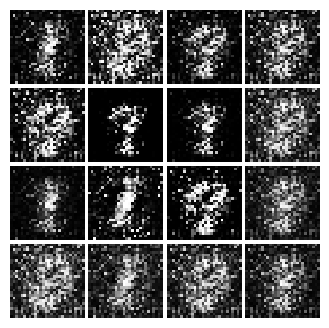

Epoch: 1, Iter: 760, D: 1.254, G:1.163


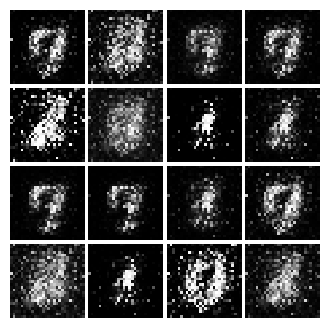

Epoch: 1, Iter: 780, D: 1.296, G:1.484


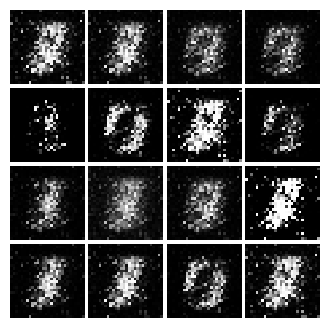

Epoch: 1, Iter: 800, D: 1.505, G:0.2287


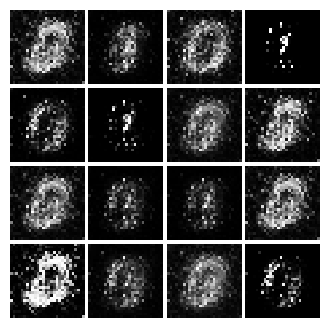

Epoch: 1, Iter: 820, D: 0.9041, G:1.47


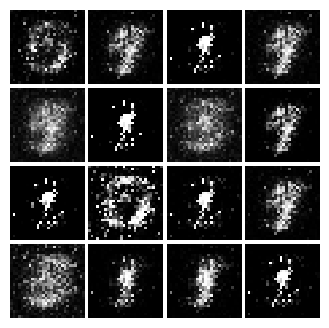

Epoch: 1, Iter: 840, D: 1.035, G:1.209


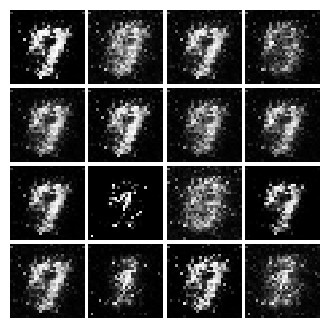

Epoch: 1, Iter: 860, D: 1.085, G:1.147


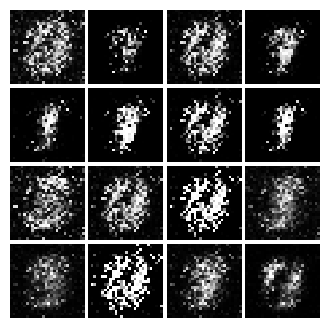

Epoch: 1, Iter: 880, D: 1.253, G:1.038


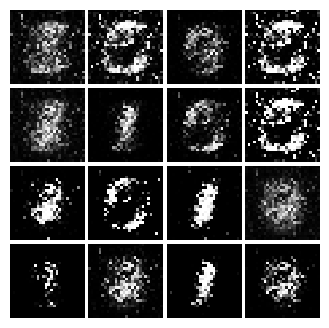

Epoch: 1, Iter: 900, D: 1.268, G:0.985


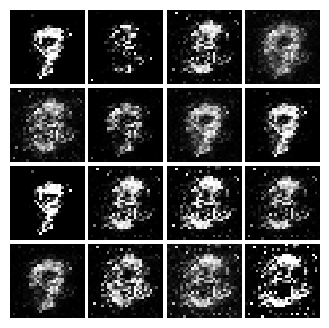

Epoch: 1, Iter: 920, D: 1.223, G:0.9171


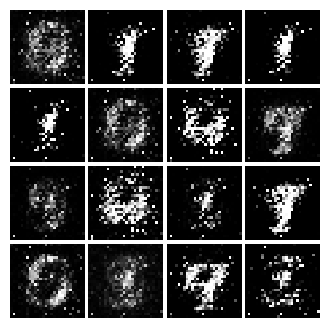

Epoch: 2, Iter: 940, D: 1.181, G:0.9463


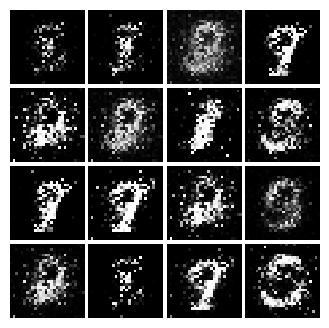

Epoch: 2, Iter: 960, D: 1.304, G:0.867


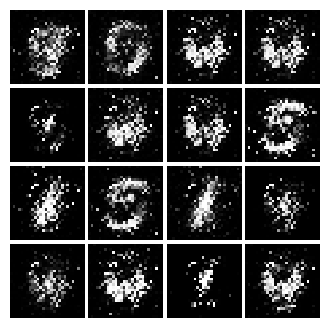

Epoch: 2, Iter: 980, D: 1.251, G:2.226


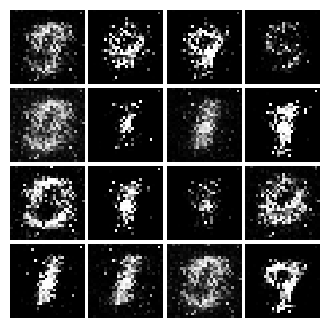

Epoch: 2, Iter: 1000, D: 1.128, G:1.756


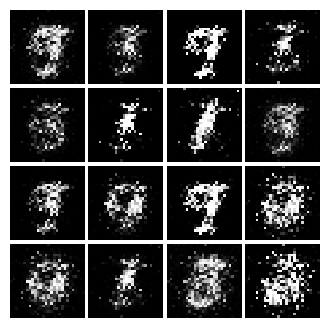

Epoch: 2, Iter: 1020, D: 1.493, G:1.13


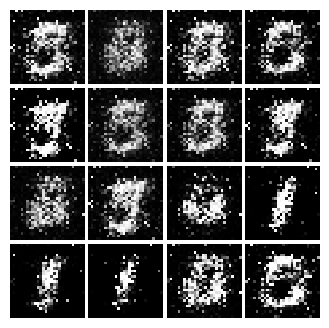

Epoch: 2, Iter: 1040, D: 1.08, G:1.614


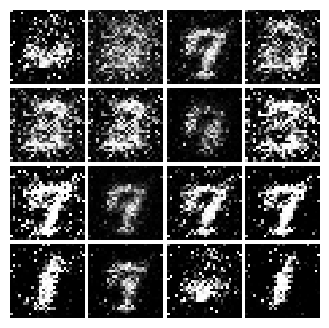

Epoch: 2, Iter: 1060, D: 1.185, G:0.6531


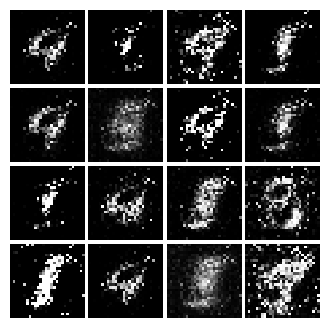

Epoch: 2, Iter: 1080, D: 1.479, G:1.108


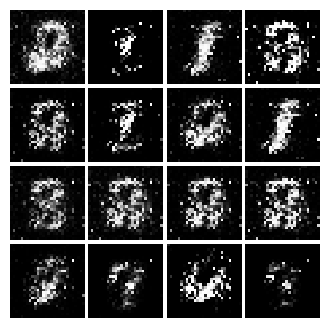

Epoch: 2, Iter: 1100, D: 1.125, G:1.371


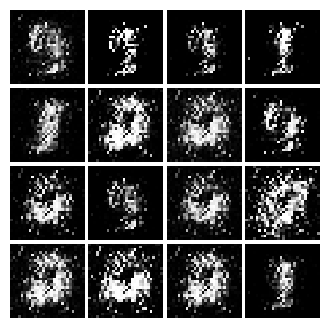

Epoch: 2, Iter: 1120, D: 1.256, G:1.468


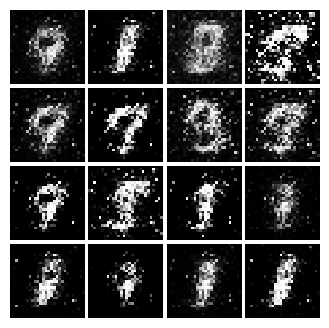

Epoch: 2, Iter: 1140, D: 1.352, G:1.665


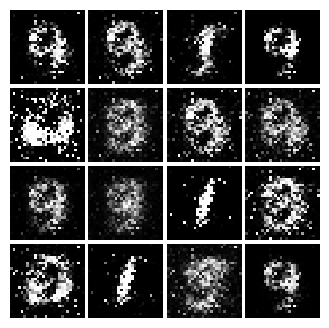

Epoch: 2, Iter: 1160, D: 1.012, G:1.562


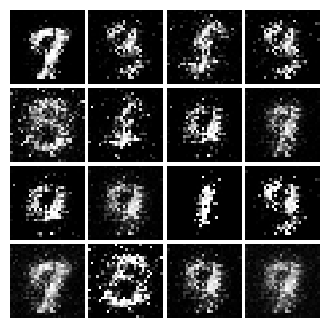

Epoch: 2, Iter: 1180, D: 1.304, G:0.9981


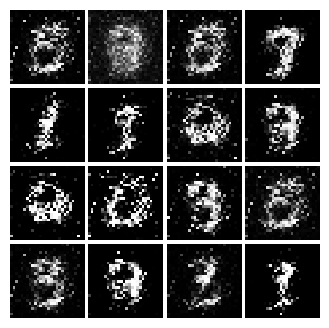

Epoch: 2, Iter: 1200, D: 1.369, G:4.078


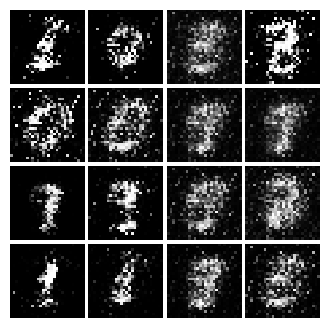

Epoch: 2, Iter: 1220, D: 1.559, G:0.5391


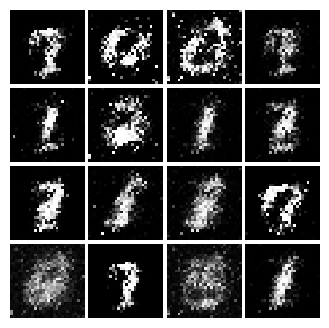

Epoch: 2, Iter: 1240, D: 1.262, G:0.904


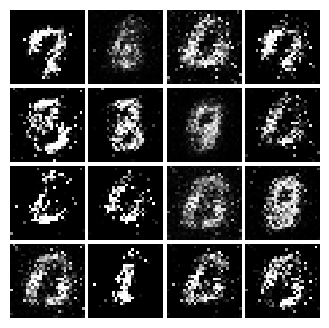

Epoch: 2, Iter: 1260, D: 1.163, G:1.095


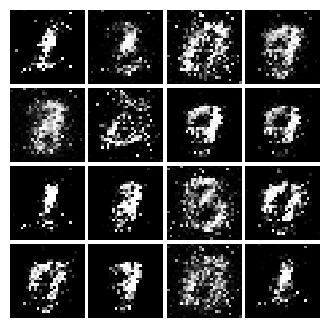

Epoch: 2, Iter: 1280, D: 1.441, G:1.598


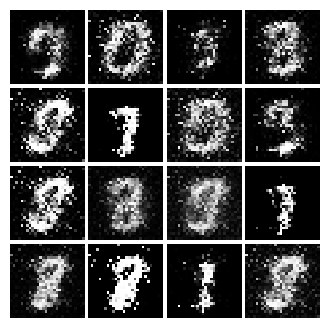

Epoch: 2, Iter: 1300, D: 1.132, G:1.208


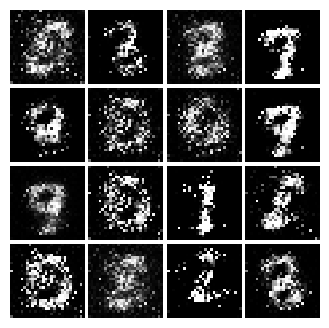

Epoch: 2, Iter: 1320, D: 1.038, G:0.8441


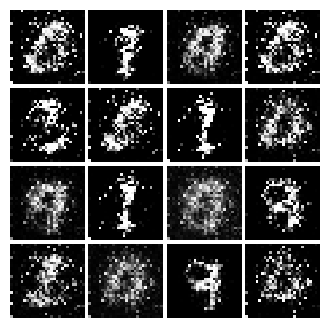

Epoch: 2, Iter: 1340, D: 1.334, G:0.9989


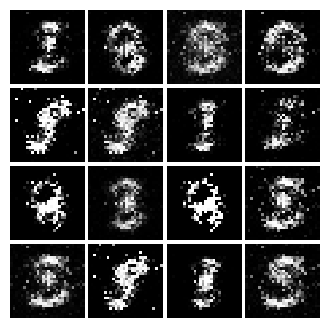

Epoch: 2, Iter: 1360, D: 1.32, G:1.43


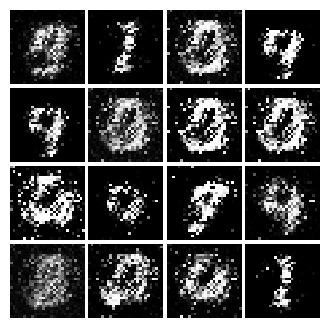

Epoch: 2, Iter: 1380, D: 0.9297, G:1.169


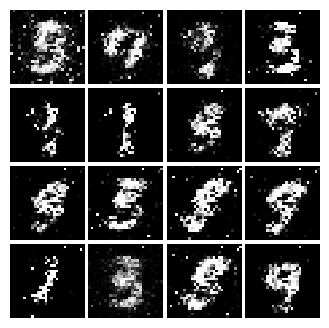

Epoch: 2, Iter: 1400, D: 1.287, G:0.9742


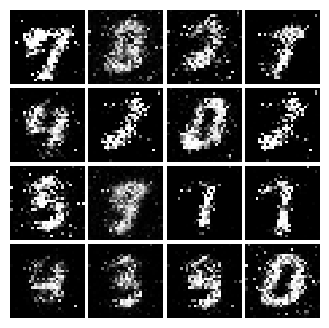

Epoch: 3, Iter: 1420, D: 1.127, G:1.058


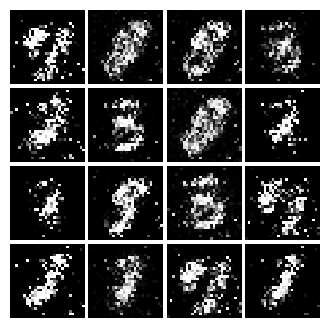

Epoch: 3, Iter: 1440, D: 1.334, G:1.052


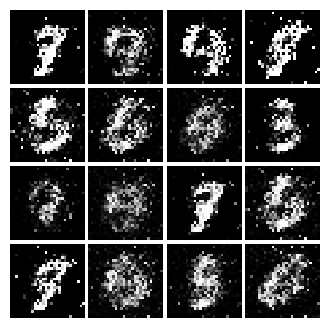

Epoch: 3, Iter: 1460, D: 1.266, G:0.9256


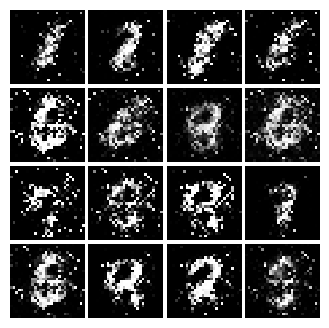

Epoch: 3, Iter: 1480, D: 1.241, G:1.25


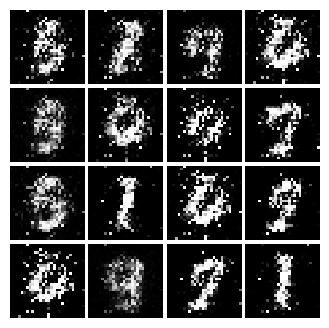

Epoch: 3, Iter: 1500, D: 1.663, G:0.2354


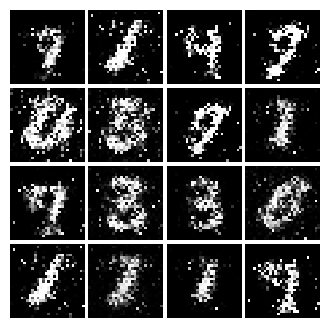

Epoch: 3, Iter: 1520, D: 1.294, G:0.9934


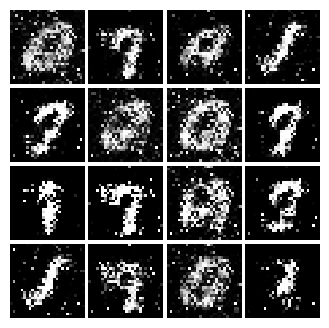

Epoch: 3, Iter: 1540, D: 1.144, G:1.535


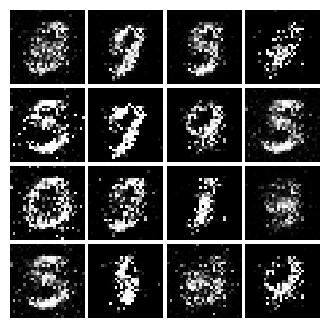

Epoch: 3, Iter: 1560, D: 1.084, G:0.988


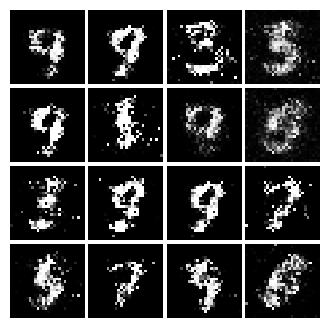

Epoch: 3, Iter: 1580, D: 1.293, G:1.287


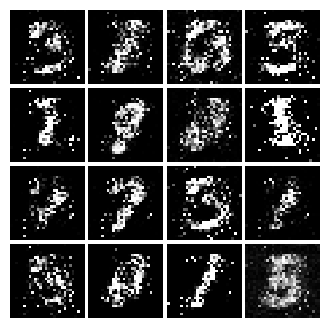

Epoch: 3, Iter: 1600, D: 1.038, G:0.9276


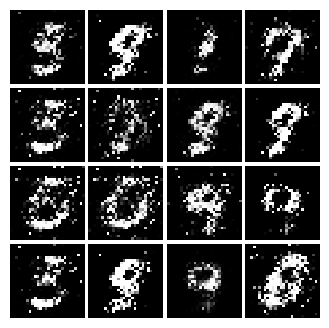

Epoch: 3, Iter: 1620, D: 1.126, G:1.059


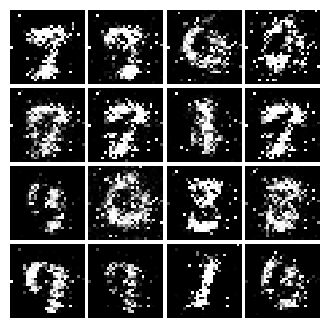

Epoch: 3, Iter: 1640, D: 1.232, G:1.083


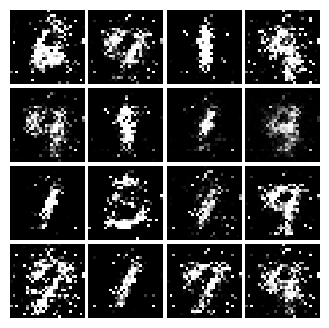

Epoch: 3, Iter: 1660, D: 0.9111, G:1.581


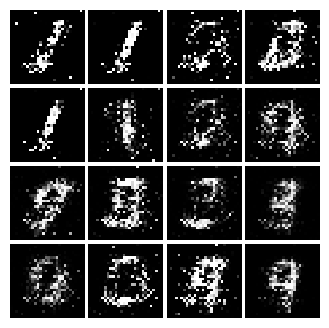

Epoch: 3, Iter: 1680, D: 1.117, G:1.577


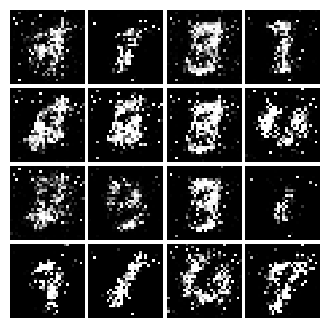

Epoch: 3, Iter: 1700, D: 1.062, G:1.497


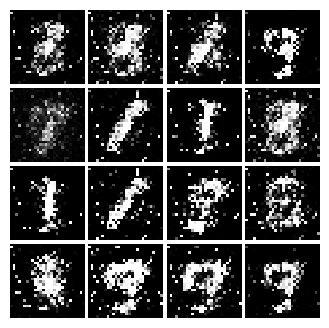

Epoch: 3, Iter: 1720, D: 1.451, G:1.831


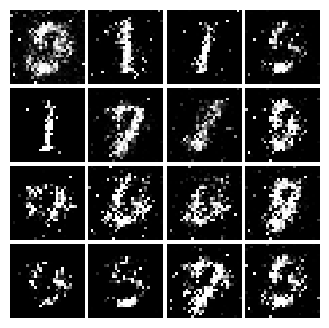

Epoch: 3, Iter: 1740, D: 1.288, G:1.302


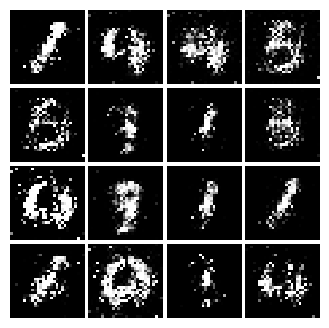

Epoch: 3, Iter: 1760, D: 1.06, G:1.027


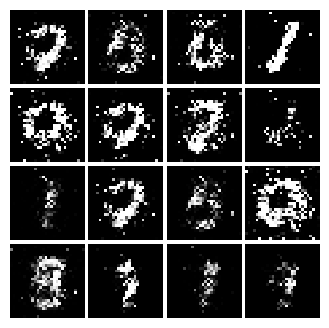

Epoch: 3, Iter: 1780, D: 1.203, G:0.9753


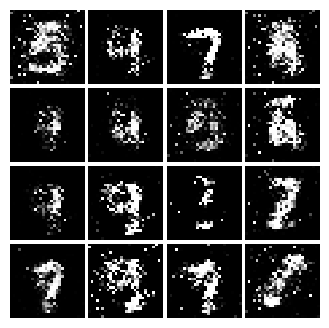

Epoch: 3, Iter: 1800, D: 1.306, G:1.09


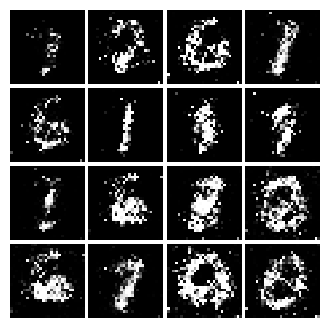

Epoch: 3, Iter: 1820, D: 1.321, G:0.9946


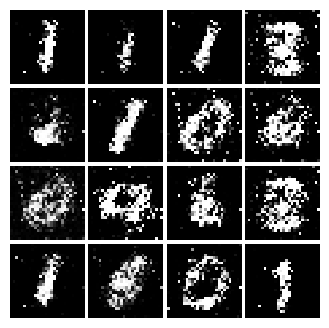

Epoch: 3, Iter: 1840, D: 1.348, G:0.8872


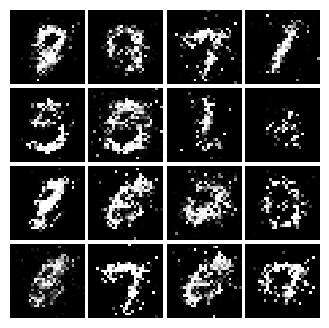

Epoch: 3, Iter: 1860, D: 1.534, G:0.9033


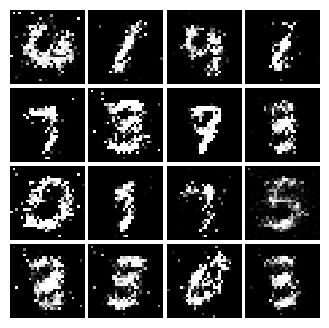

Epoch: 4, Iter: 1880, D: 1.191, G:1.035


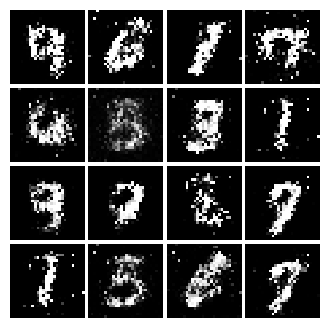

Epoch: 4, Iter: 1900, D: 1.4, G:0.9366


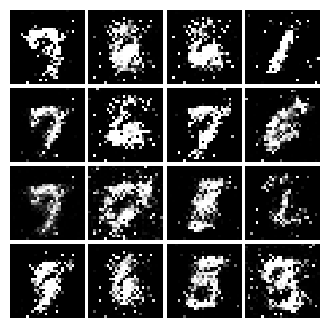

Epoch: 4, Iter: 1920, D: 1.314, G:1.309


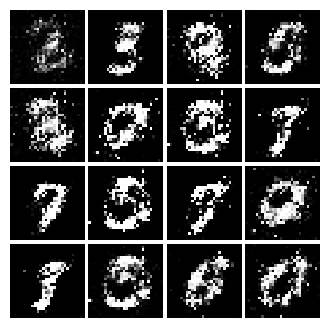

Epoch: 4, Iter: 1940, D: 1.1, G:1.177


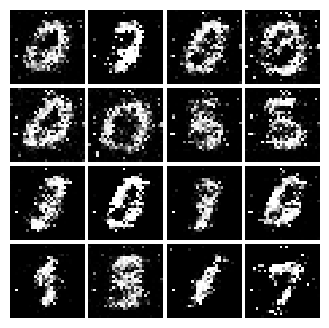

Epoch: 4, Iter: 1960, D: 1.149, G:1.18


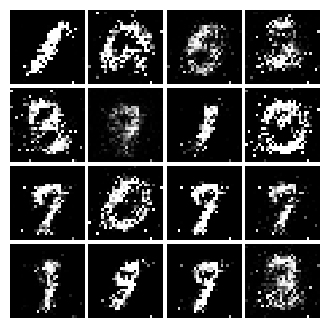

Epoch: 4, Iter: 1980, D: 1.571, G:0.3769


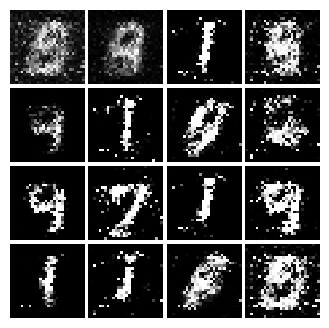

Epoch: 4, Iter: 2000, D: 1.18, G:1.038


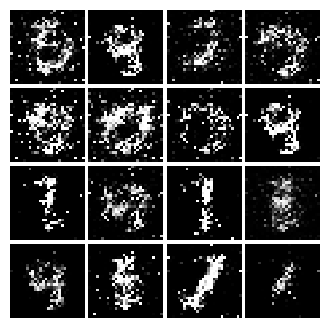

Epoch: 4, Iter: 2020, D: 1.236, G:0.9295


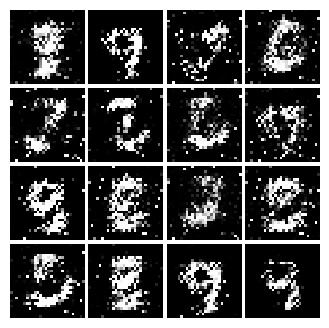

Epoch: 4, Iter: 2040, D: 1.275, G:0.9028


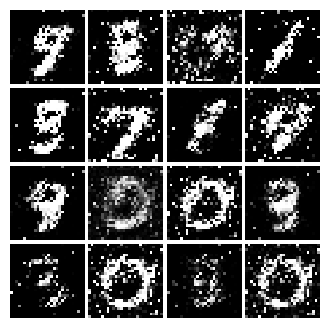

Epoch: 4, Iter: 2060, D: 1.403, G:0.7567


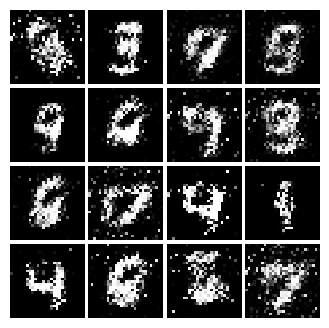

Epoch: 4, Iter: 2080, D: 1.357, G:0.7638


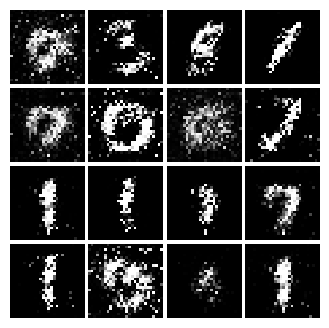

Epoch: 4, Iter: 2100, D: 1.355, G:0.8375


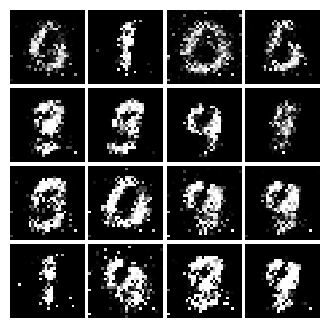

Epoch: 4, Iter: 2120, D: 1.601, G:1.045


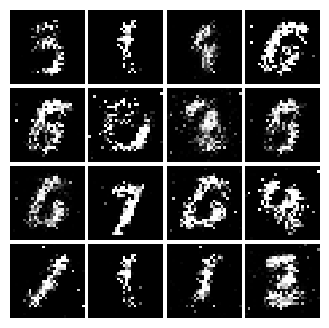

Epoch: 4, Iter: 2140, D: 1.723, G:0.6765


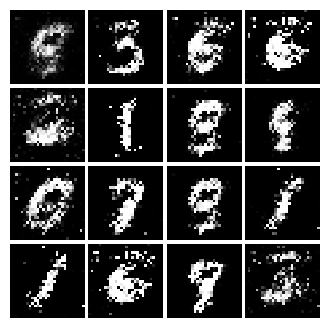

Epoch: 4, Iter: 2160, D: 1.273, G:0.7951


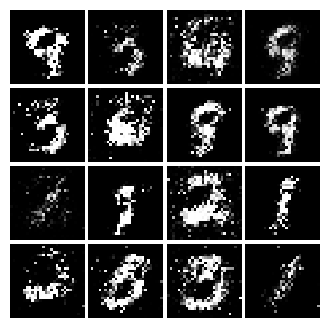

Epoch: 4, Iter: 2180, D: 1.277, G:1.126


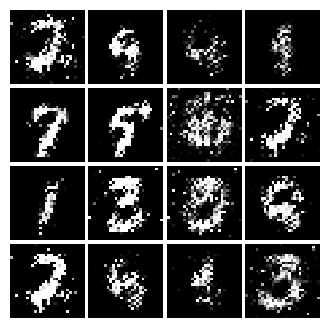

Epoch: 4, Iter: 2200, D: 1.209, G:0.8822


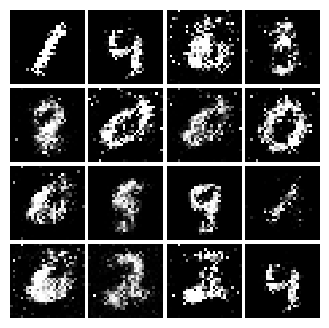

Epoch: 4, Iter: 2220, D: 1.299, G:0.8571


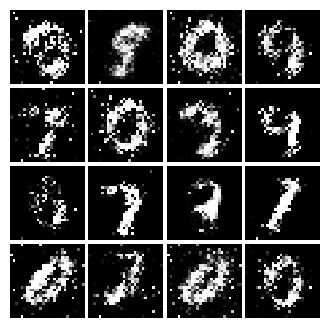

Epoch: 4, Iter: 2240, D: 1.308, G:0.8667


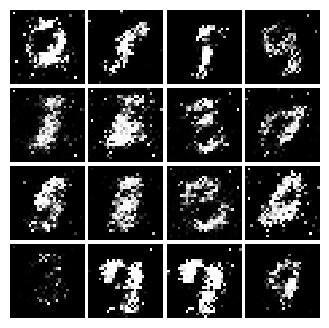

Epoch: 4, Iter: 2260, D: 1.377, G:0.8669


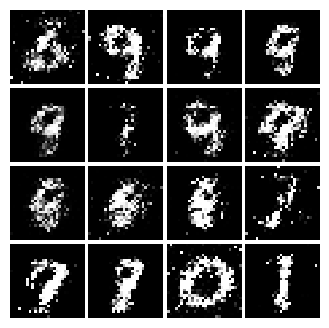

Epoch: 4, Iter: 2280, D: 1.578, G:2.203


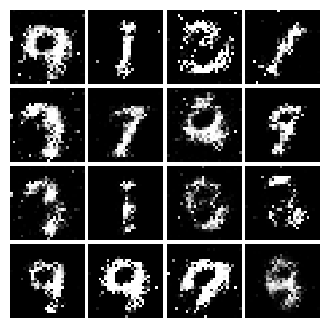

Epoch: 4, Iter: 2300, D: 1.308, G:0.7199


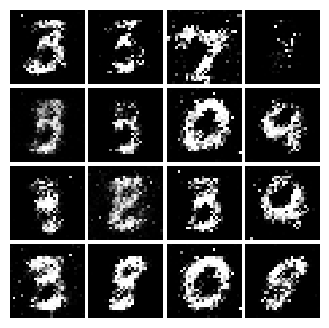

Epoch: 4, Iter: 2320, D: 1.328, G:0.9541


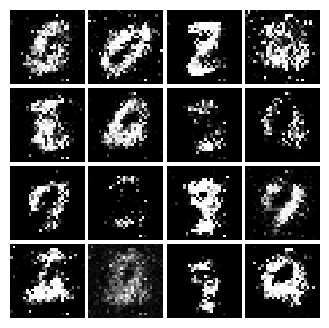

Epoch: 4, Iter: 2340, D: 1.315, G:0.8754


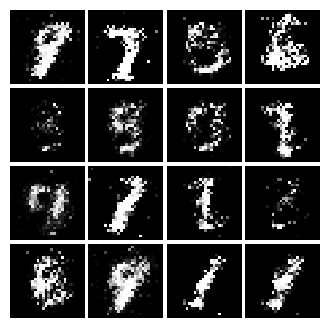

Epoch: 5, Iter: 2360, D: 1.419, G:1.013


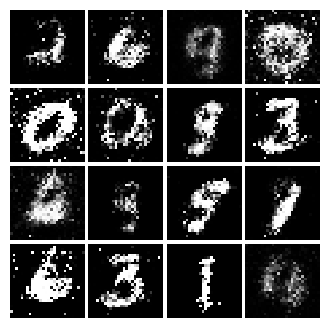

Epoch: 5, Iter: 2380, D: 1.264, G:0.8046


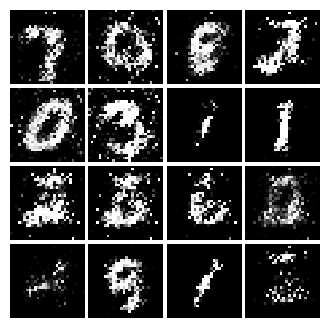

Epoch: 5, Iter: 2400, D: 1.27, G:0.758


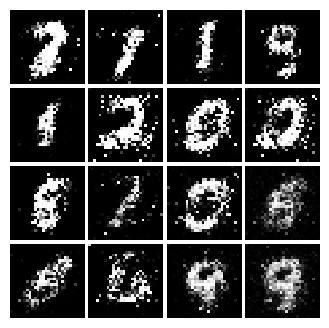

Epoch: 5, Iter: 2420, D: 1.347, G:0.8467


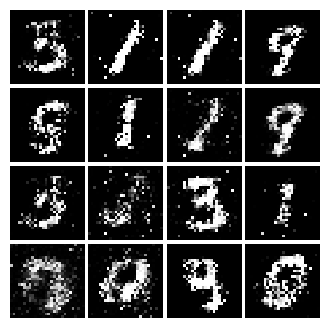

Epoch: 5, Iter: 2440, D: 1.202, G:0.8439


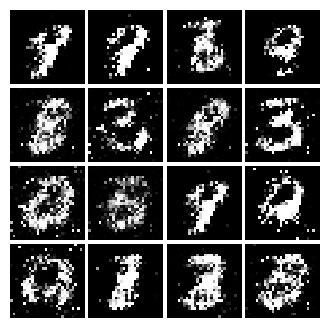

Epoch: 5, Iter: 2460, D: 1.232, G:0.9642


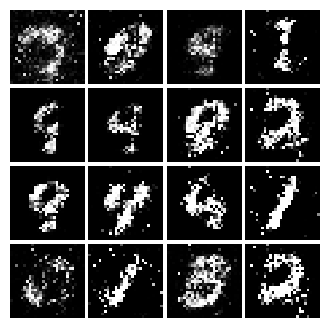

Epoch: 5, Iter: 2480, D: 1.325, G:0.7905


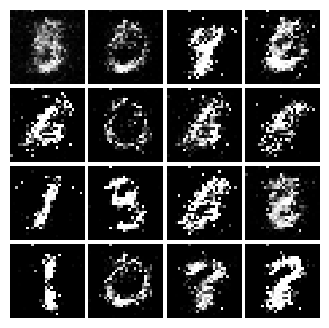

Epoch: 5, Iter: 2500, D: 1.473, G:0.8223


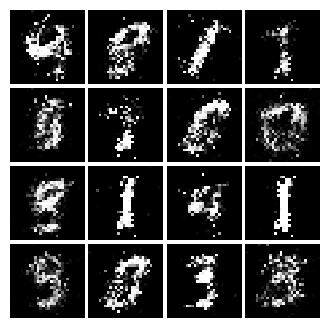

Epoch: 5, Iter: 2520, D: 1.192, G:0.7197


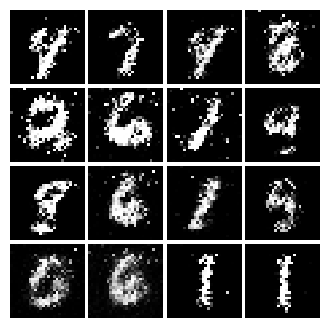

Epoch: 5, Iter: 2540, D: 1.267, G:0.7654


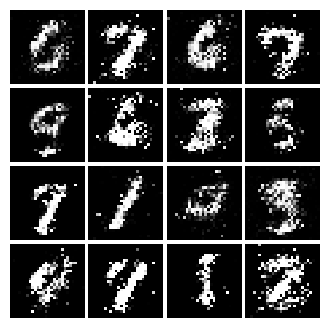

Epoch: 5, Iter: 2560, D: 1.372, G:0.9109


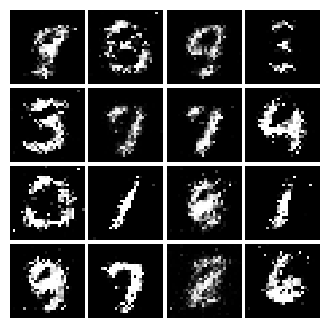

Epoch: 5, Iter: 2580, D: 1.263, G:0.8536


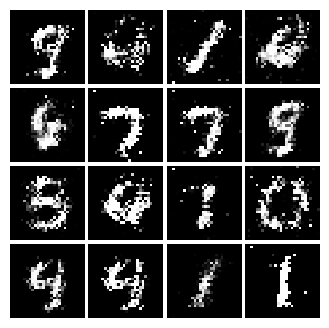

Epoch: 5, Iter: 2600, D: 1.375, G:0.81


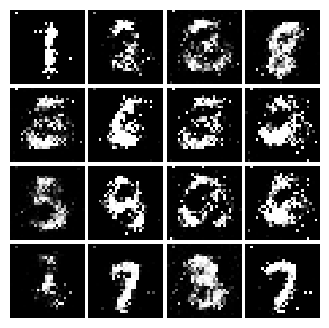

Epoch: 5, Iter: 2620, D: 1.287, G:0.8536


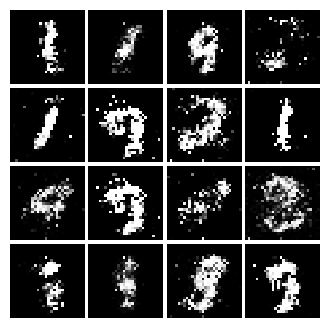

Epoch: 5, Iter: 2640, D: 1.222, G:0.9751


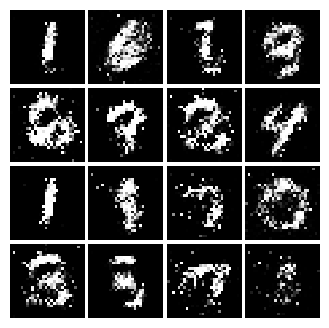

Epoch: 5, Iter: 2660, D: 1.331, G:0.8156


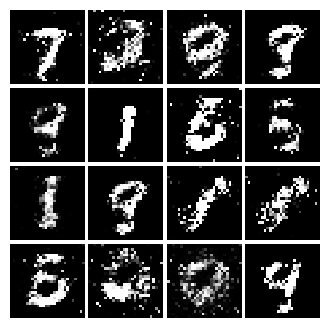

Epoch: 5, Iter: 2680, D: 1.417, G:0.8302


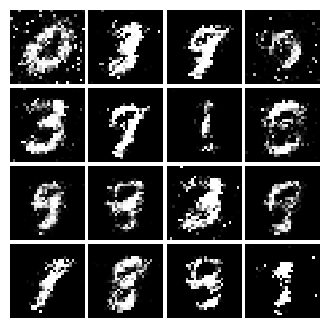

Epoch: 5, Iter: 2700, D: 1.253, G:0.8896


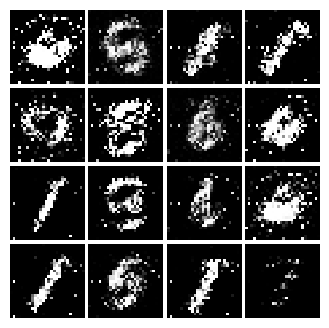

Epoch: 5, Iter: 2720, D: 1.323, G:0.803


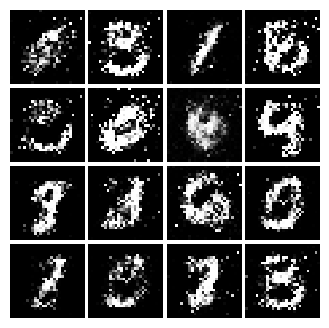

Epoch: 5, Iter: 2740, D: 1.244, G:0.8792


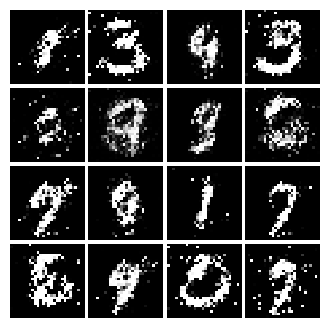

Epoch: 5, Iter: 2760, D: 1.391, G:0.7953


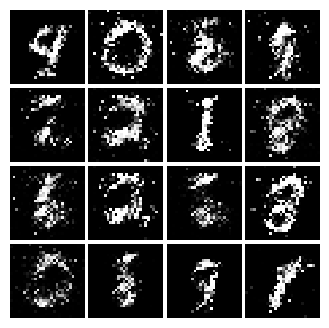

Epoch: 5, Iter: 2780, D: 1.268, G:0.8591


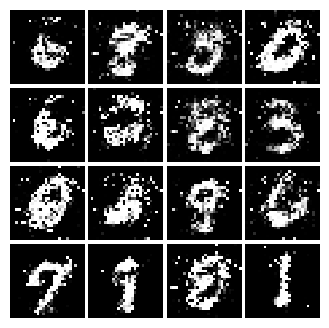

Epoch: 5, Iter: 2800, D: 1.316, G:1.011


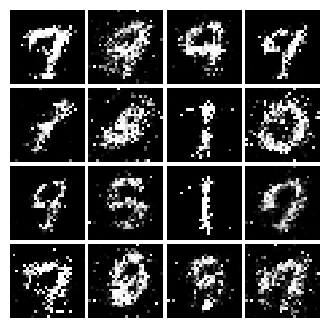

Epoch: 6, Iter: 2820, D: 1.462, G:0.8609


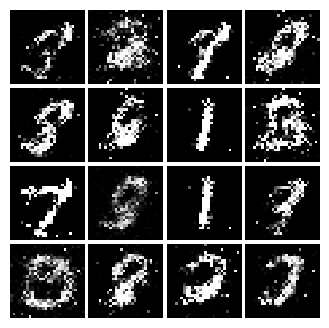

Epoch: 6, Iter: 2840, D: 1.248, G:0.5941


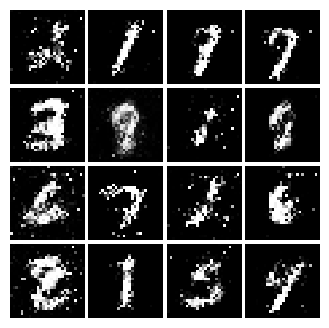

Epoch: 6, Iter: 2860, D: 1.263, G:0.9296


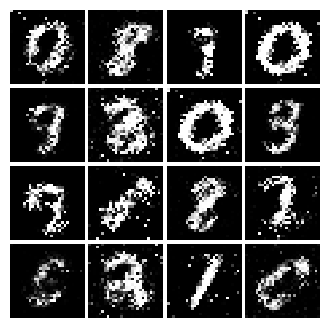

Epoch: 6, Iter: 2880, D: 1.308, G:0.86


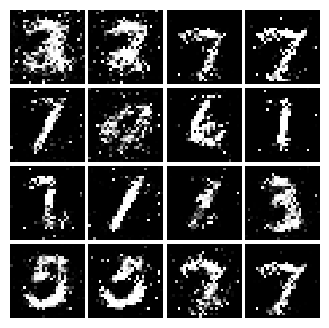

Epoch: 6, Iter: 2900, D: 1.303, G:0.851


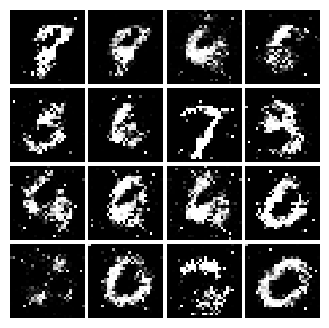

Epoch: 6, Iter: 2920, D: 1.392, G:0.9588


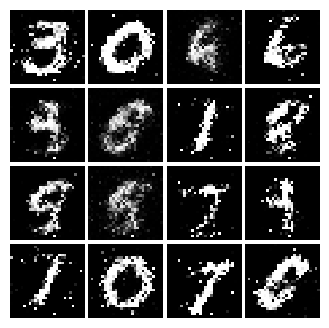

Epoch: 6, Iter: 2940, D: 1.383, G:0.8156


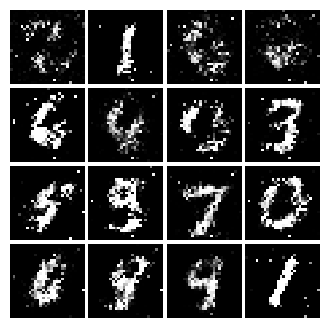

Epoch: 6, Iter: 2960, D: 1.286, G:0.8277


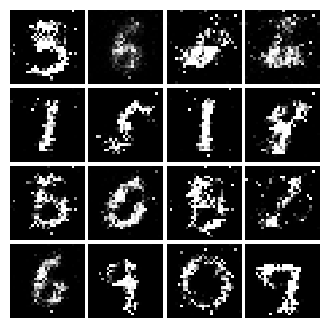

Epoch: 6, Iter: 2980, D: 1.604, G:1.324


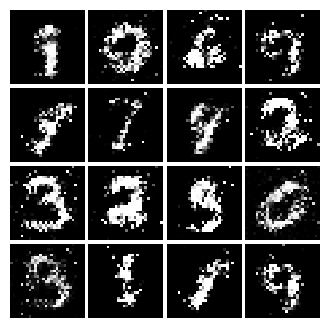

Epoch: 6, Iter: 3000, D: 1.299, G:0.8572


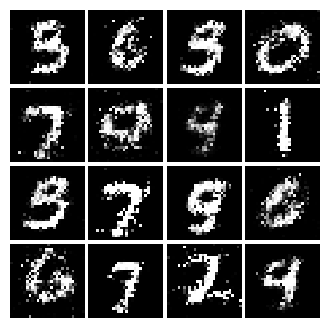

Epoch: 6, Iter: 3020, D: 1.42, G:0.7814


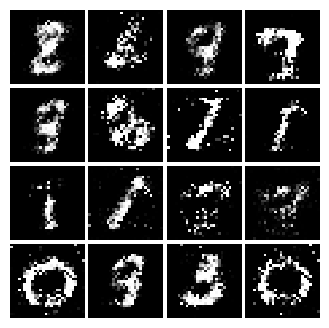

Epoch: 6, Iter: 3040, D: 1.255, G:0.834


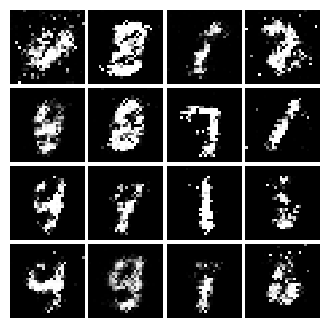

Epoch: 6, Iter: 3060, D: 1.327, G:0.7544


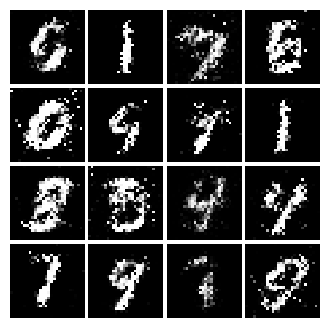

Epoch: 6, Iter: 3080, D: 1.332, G:0.8046


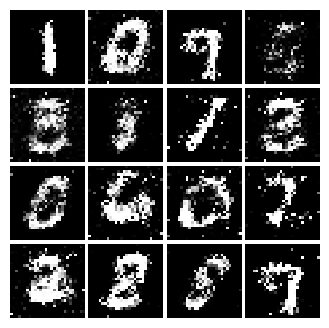

Epoch: 6, Iter: 3100, D: 1.262, G:0.7345


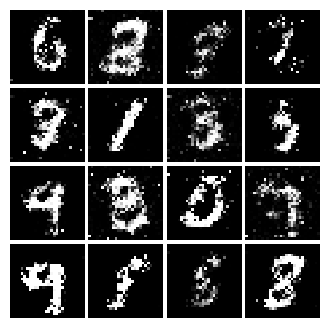

Epoch: 6, Iter: 3120, D: 1.387, G:1.234


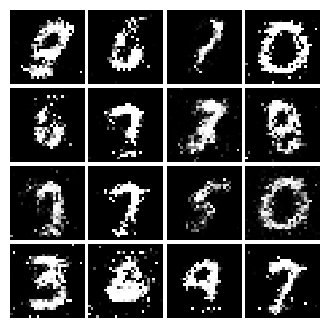

Epoch: 6, Iter: 3140, D: 1.328, G:0.8056


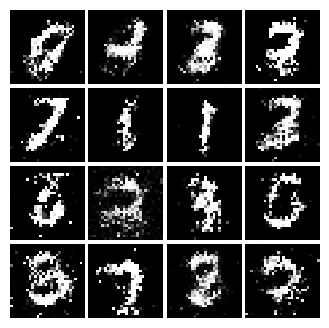

Epoch: 6, Iter: 3160, D: 1.457, G:0.8923


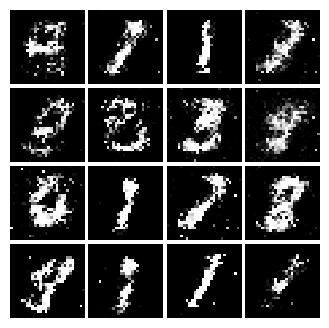

Epoch: 6, Iter: 3180, D: 1.388, G:0.8017


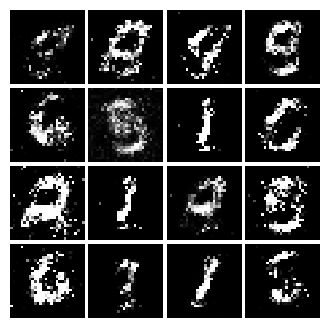

Epoch: 6, Iter: 3200, D: 1.329, G:0.8999


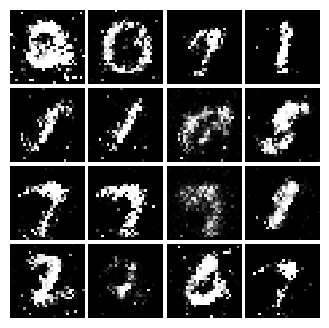

Epoch: 6, Iter: 3220, D: 1.357, G:0.7814


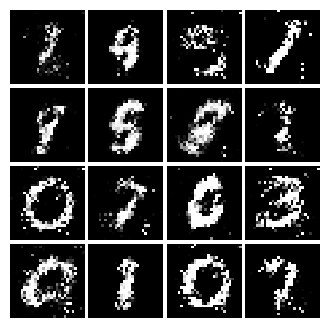

Epoch: 6, Iter: 3240, D: 1.336, G:0.8102


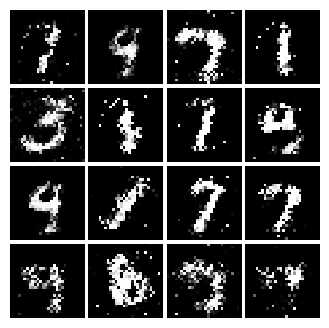

Epoch: 6, Iter: 3260, D: 1.38, G:0.7823


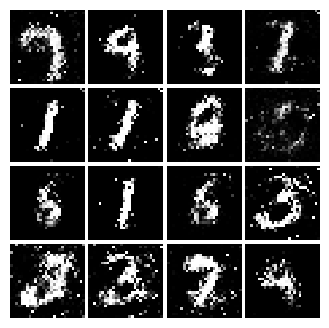

Epoch: 6, Iter: 3280, D: 1.286, G:0.8077


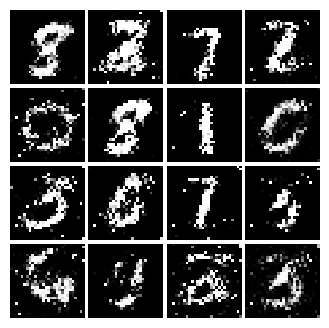

Epoch: 7, Iter: 3300, D: 1.207, G:0.7309


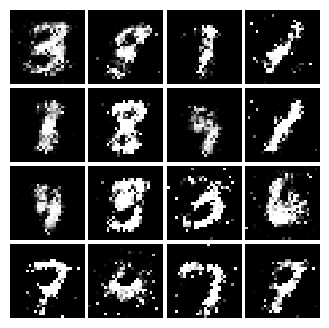

Epoch: 7, Iter: 3320, D: 1.336, G:0.8205


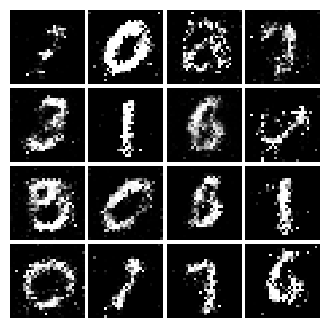

Epoch: 7, Iter: 3340, D: 1.319, G:0.8281


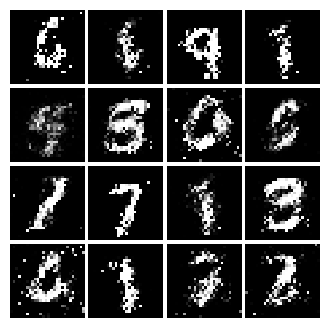

Epoch: 7, Iter: 3360, D: 1.343, G:0.8575


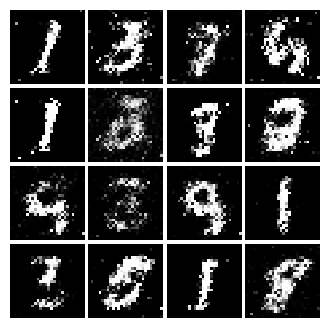

Epoch: 7, Iter: 3380, D: 1.339, G:0.8544


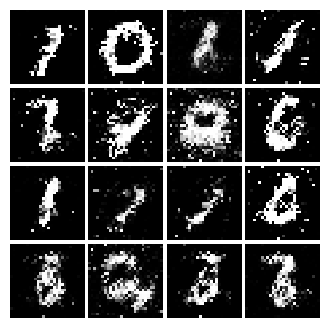

Epoch: 7, Iter: 3400, D: 1.354, G:0.8749


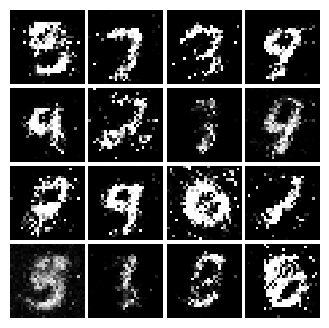

Epoch: 7, Iter: 3420, D: 1.395, G:0.823


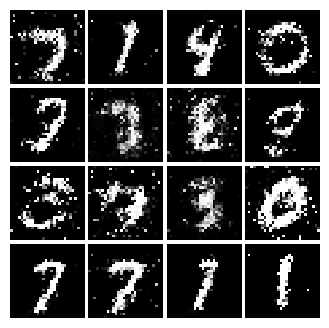

Epoch: 7, Iter: 3440, D: 1.386, G:0.8436


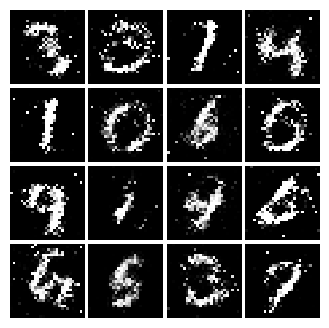

Epoch: 7, Iter: 3460, D: 1.316, G:0.896


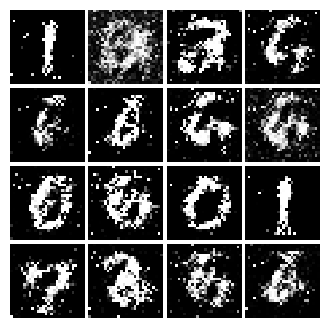

Epoch: 7, Iter: 3480, D: 1.41, G:0.7858


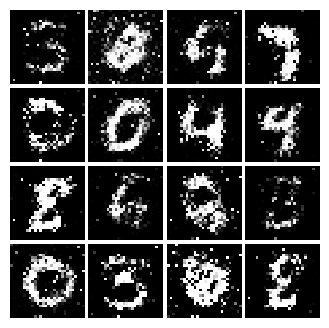

Epoch: 7, Iter: 3500, D: 1.286, G:0.9046


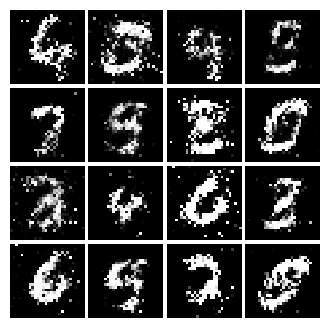

Epoch: 7, Iter: 3520, D: 1.344, G:0.8328


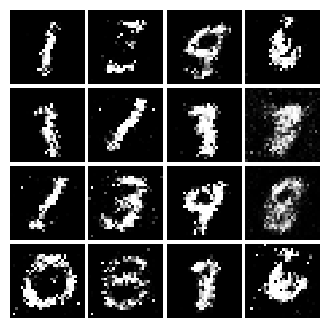

Epoch: 7, Iter: 3540, D: 1.302, G:0.8867


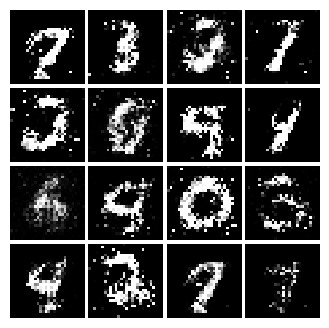

Epoch: 7, Iter: 3560, D: 1.267, G:0.886


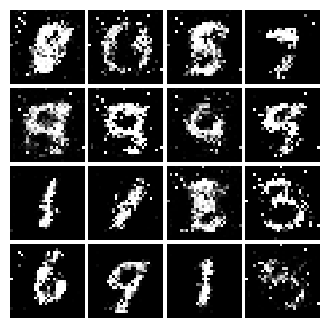

Epoch: 7, Iter: 3580, D: 1.187, G:1.034


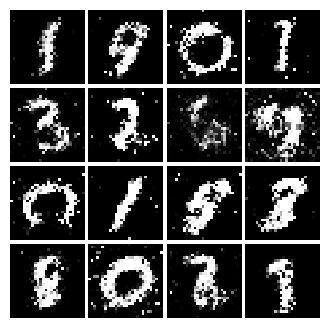

Epoch: 7, Iter: 3600, D: 1.373, G:0.8359


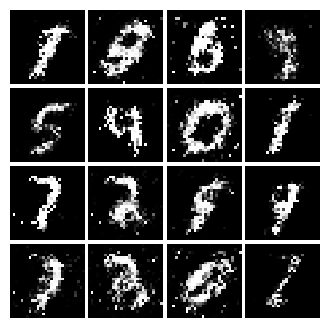

Epoch: 7, Iter: 3620, D: 1.406, G:0.6953


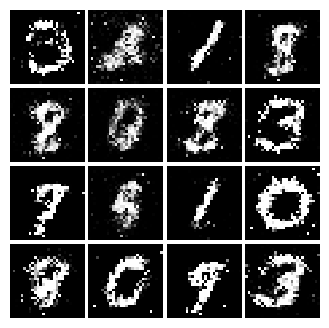

Epoch: 7, Iter: 3640, D: 1.331, G:0.7427


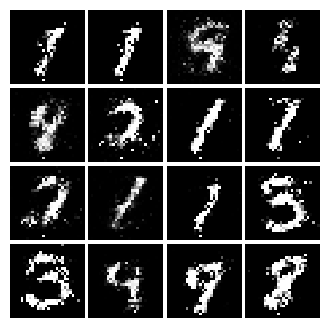

Epoch: 7, Iter: 3660, D: 1.369, G:0.8


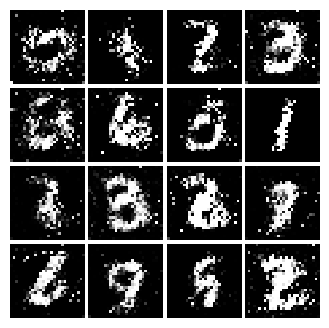

Epoch: 7, Iter: 3680, D: 1.328, G:0.9105


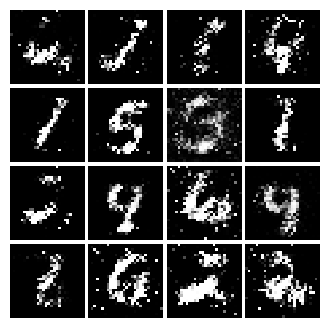

Epoch: 7, Iter: 3700, D: 1.41, G:0.8472


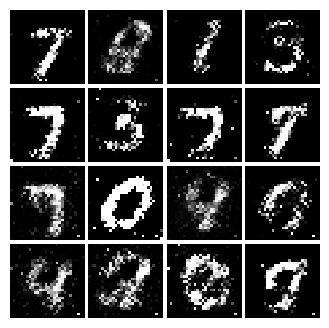

Epoch: 7, Iter: 3720, D: 1.328, G:0.7798


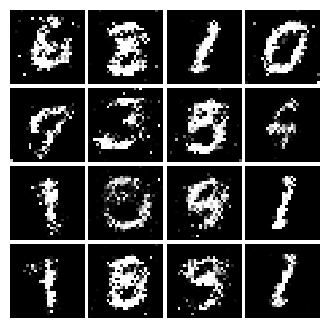

Epoch: 7, Iter: 3740, D: 1.412, G:0.734


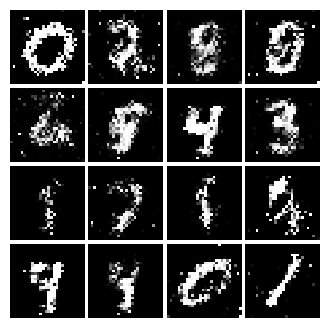

Epoch: 8, Iter: 3760, D: 1.402, G:0.758


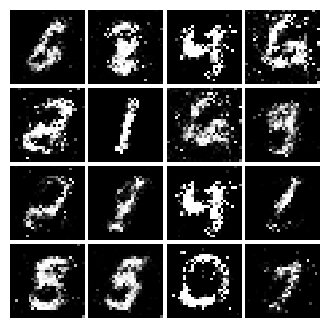

Epoch: 8, Iter: 3780, D: 1.371, G:0.7596


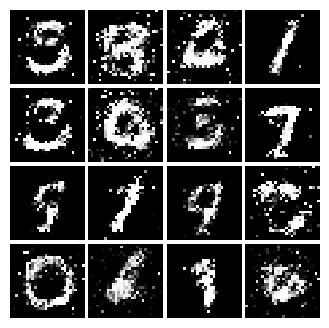

Epoch: 8, Iter: 3800, D: 1.394, G:0.7617


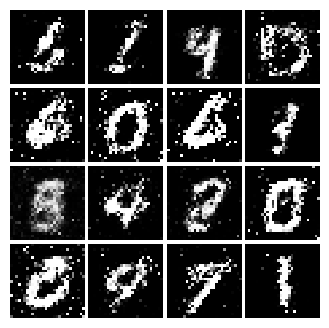

Epoch: 8, Iter: 3820, D: 1.407, G:0.8308


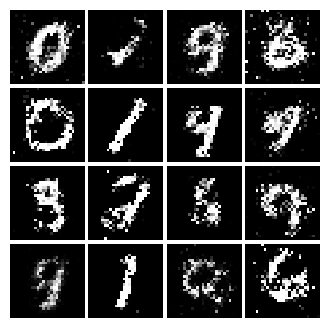

Epoch: 8, Iter: 3840, D: 1.331, G:0.7579


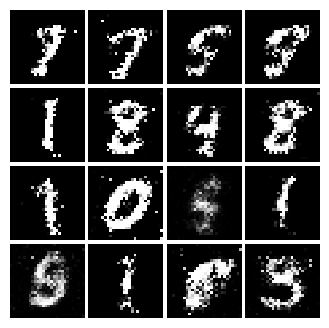

Epoch: 8, Iter: 3860, D: 1.37, G:0.8091


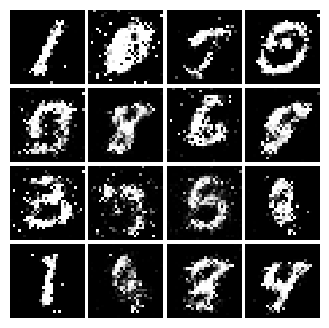

Epoch: 8, Iter: 3880, D: 1.34, G:0.7225


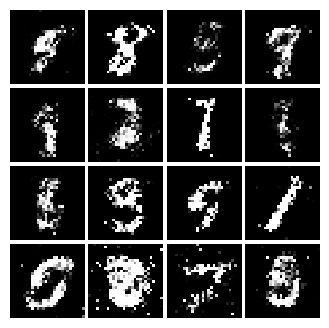

Epoch: 8, Iter: 3900, D: 1.396, G:0.7712


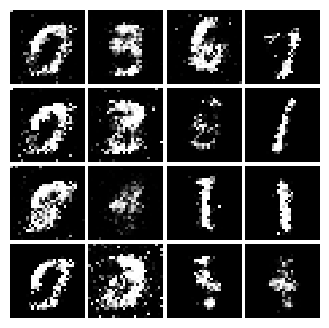

Epoch: 8, Iter: 3920, D: 1.293, G:0.7922


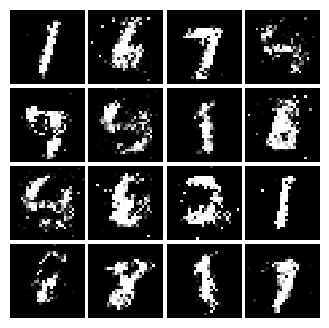

Epoch: 8, Iter: 3940, D: 1.367, G:0.7636


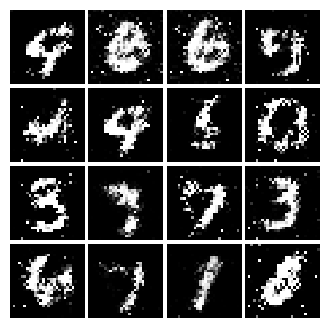

Epoch: 8, Iter: 3960, D: 1.321, G:0.8061


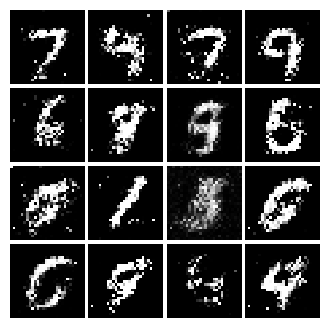

Epoch: 8, Iter: 3980, D: 1.362, G:0.7958


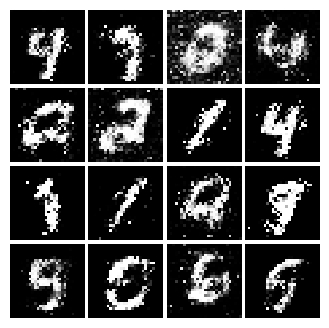

Epoch: 8, Iter: 4000, D: 1.347, G:0.8813


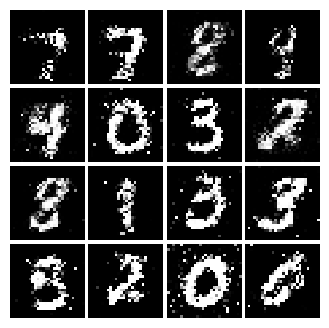

Epoch: 8, Iter: 4020, D: 1.363, G:0.8349


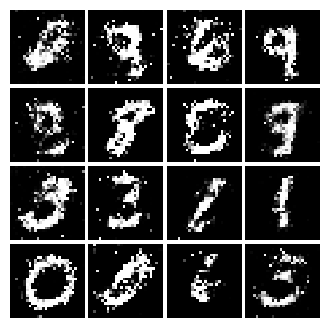

Epoch: 8, Iter: 4040, D: 1.331, G:1.05


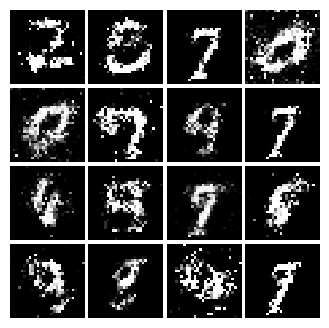

Epoch: 8, Iter: 4060, D: 1.356, G:0.7625


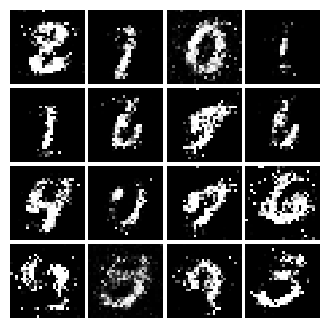

Epoch: 8, Iter: 4080, D: 1.402, G:0.7907


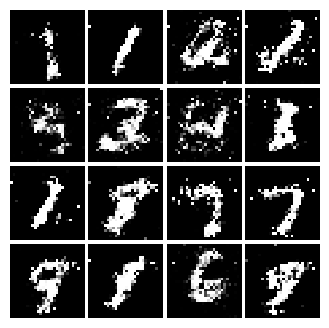

Epoch: 8, Iter: 4100, D: 1.278, G:0.7862


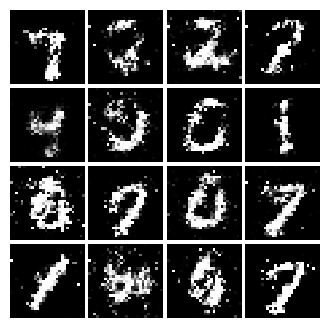

Epoch: 8, Iter: 4120, D: 1.353, G:0.7646


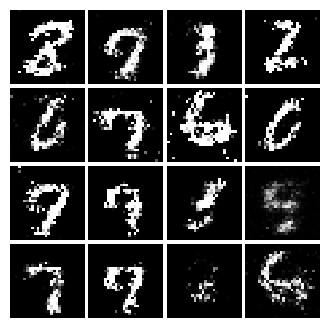

Epoch: 8, Iter: 4140, D: 1.502, G:0.6762


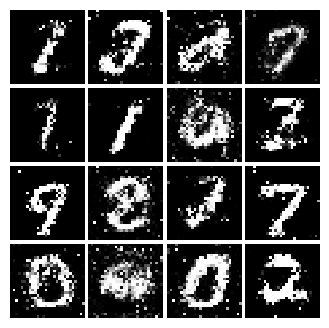

Epoch: 8, Iter: 4160, D: 1.412, G:0.8847


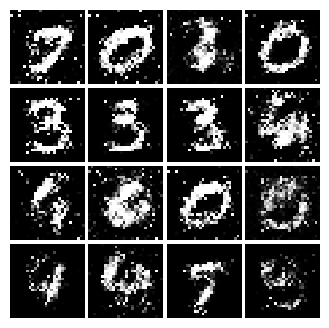

Epoch: 8, Iter: 4180, D: 1.419, G:0.7592


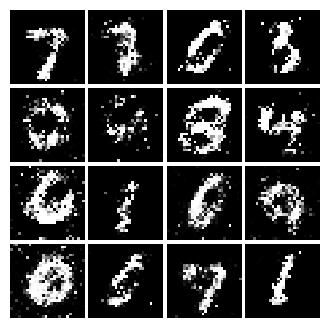

Epoch: 8, Iter: 4200, D: 1.415, G:0.5218


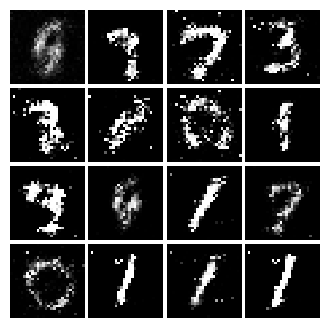

Epoch: 8, Iter: 4220, D: 1.358, G:0.7763


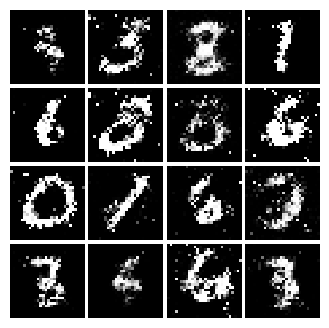

Epoch: 9, Iter: 4240, D: 1.354, G:0.7472


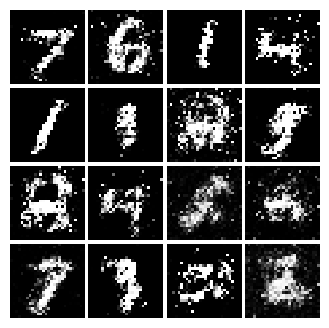

Epoch: 9, Iter: 4260, D: 1.287, G:0.7856


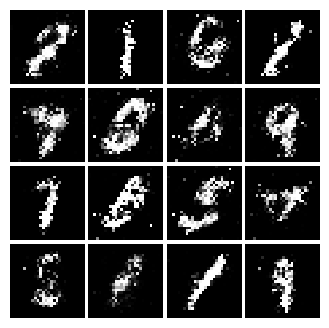

Epoch: 9, Iter: 4280, D: 1.332, G:0.7236


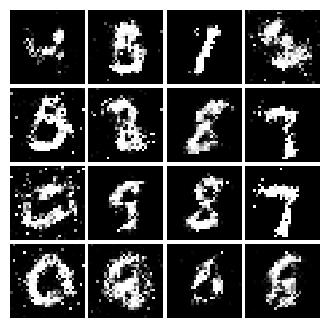

Epoch: 9, Iter: 4300, D: 1.413, G:0.7811


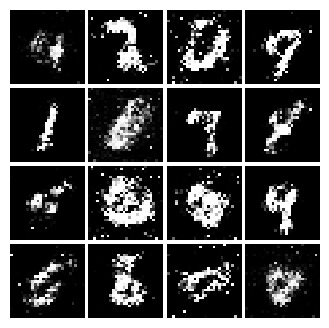

Epoch: 9, Iter: 4320, D: 1.421, G:0.8541


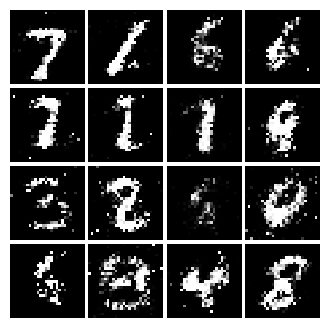

Epoch: 9, Iter: 4340, D: 1.366, G:0.7784


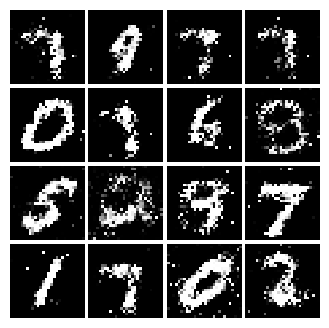

Epoch: 9, Iter: 4360, D: 1.349, G:0.7527


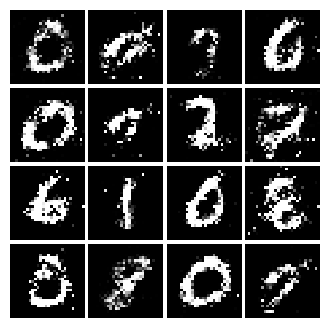

Epoch: 9, Iter: 4380, D: 1.337, G:0.7933


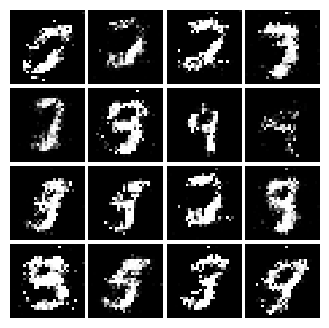

Epoch: 9, Iter: 4400, D: 1.289, G:0.8611


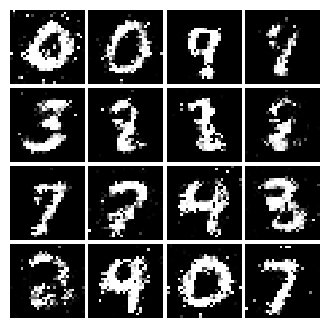

Epoch: 9, Iter: 4420, D: 1.303, G:0.7417


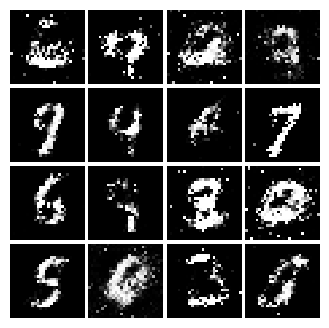

Epoch: 9, Iter: 4440, D: 1.399, G:0.7544


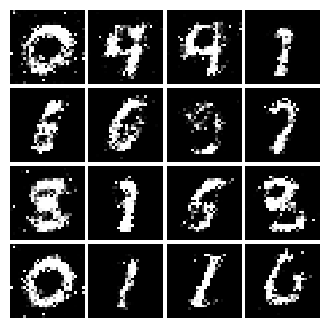

Epoch: 9, Iter: 4460, D: 1.304, G:0.7362


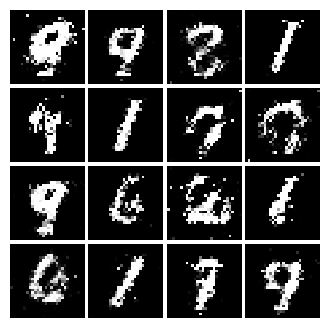

Epoch: 9, Iter: 4480, D: 1.324, G:0.8247


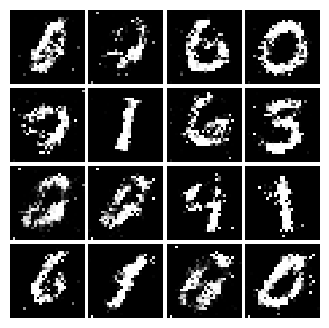

Epoch: 9, Iter: 4500, D: 1.381, G:0.746


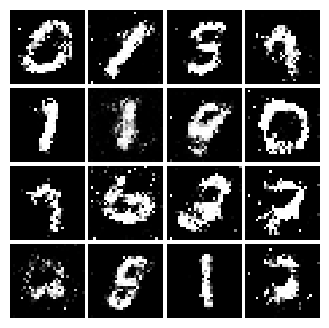

Epoch: 9, Iter: 4520, D: 1.296, G:0.7741


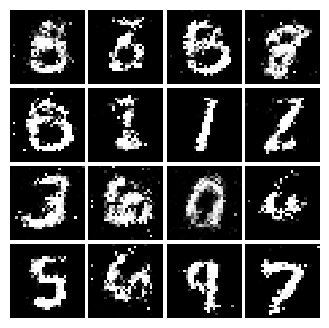

Epoch: 9, Iter: 4540, D: 1.38, G:0.7585


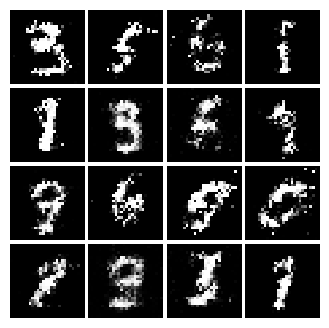

Epoch: 9, Iter: 4560, D: 1.33, G:0.8096


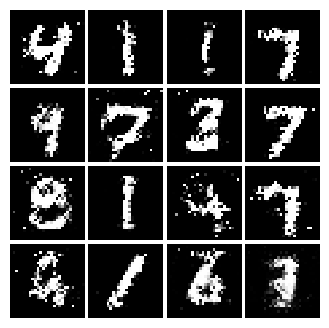

Epoch: 9, Iter: 4580, D: 1.346, G:0.8601


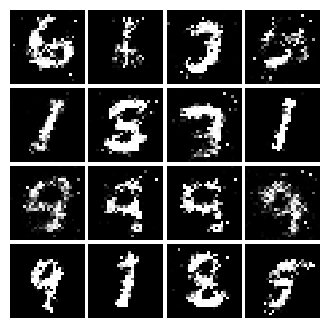

Epoch: 9, Iter: 4600, D: 1.3, G:0.7873


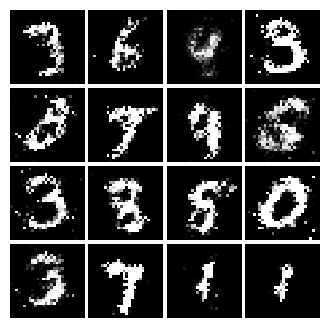

Epoch: 9, Iter: 4620, D: 1.285, G:0.6504


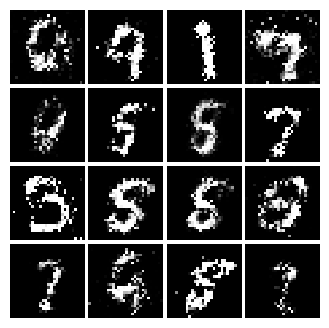

Epoch: 9, Iter: 4640, D: 1.335, G:0.749


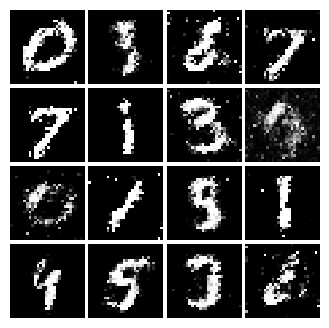

Epoch: 9, Iter: 4660, D: 1.367, G:0.8423


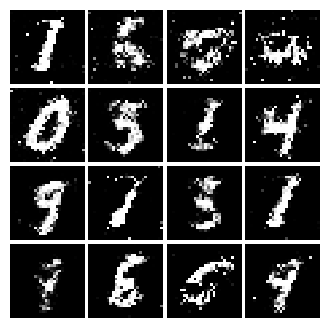

Epoch: 9, Iter: 4680, D: 1.336, G:0.7799


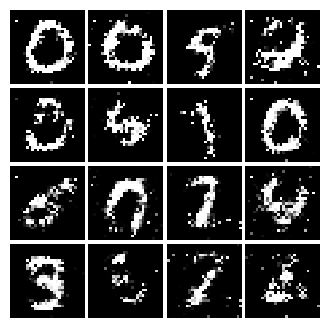

Final images


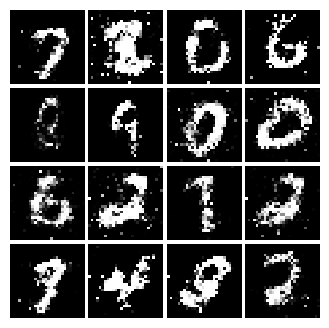

In [19]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [20]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    # Calculate the target values for real and fake data
    target_real = tf.ones_like(scores_real)
    target_fake = tf.zeros_like(scores_fake)

    # Compute the loss for real and fake data
    loss_real = tf.reduce_mean(tf.square(scores_real - target_real))
    loss_fake = tf.reduce_mean(tf.square(scores_fake - target_fake))

    # The total loss is the average of the losses for real and fake data
    loss = 0.5 * (loss_real + loss_fake)

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    # Calculate the target values for real and fake data
    target_fake = tf.ones_like(scores_fake)

    # Compute the loss for fake data
    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - target_fake))

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [21]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):

    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.137, G:0.3607


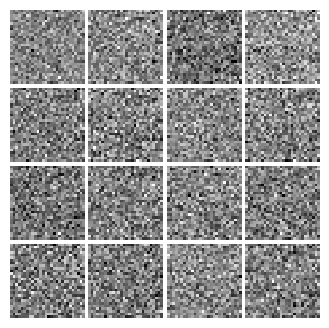

Epoch: 0, Iter: 20, D: 0.0384, G:1.067


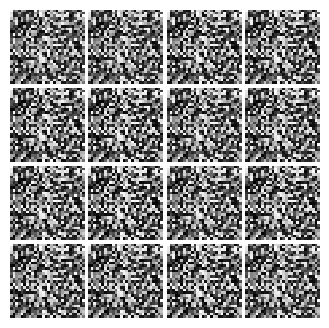

Epoch: 0, Iter: 40, D: 0.1445, G:0.9123


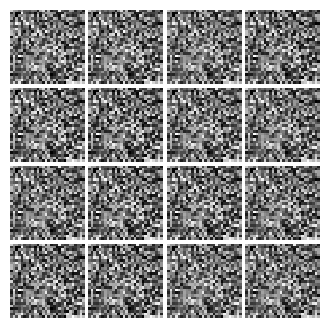

Epoch: 0, Iter: 60, D: 0.09296, G:0.615


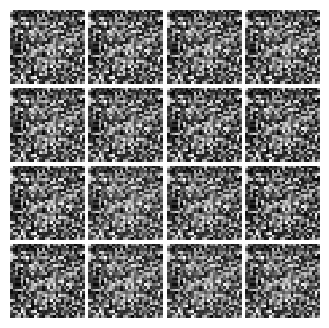

Epoch: 0, Iter: 80, D: 0.01513, G:0.6022


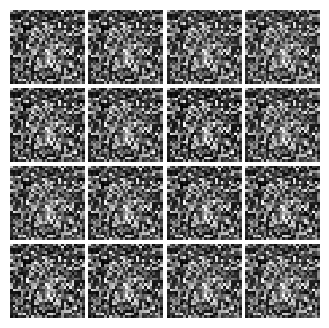

Epoch: 0, Iter: 100, D: 0.04148, G:0.4543


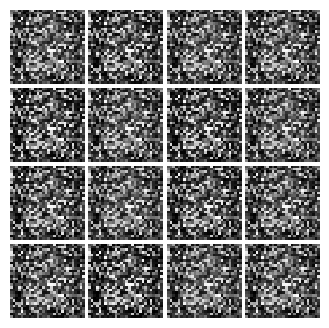

Epoch: 0, Iter: 120, D: 0.7391, G:1.498


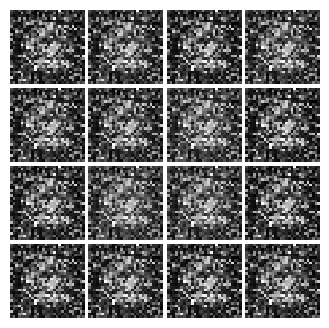

Epoch: 0, Iter: 140, D: 0.08694, G:0.5092


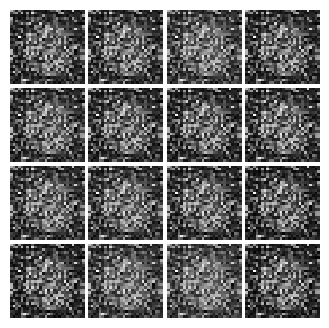

Epoch: 0, Iter: 160, D: 0.08991, G:0.5093


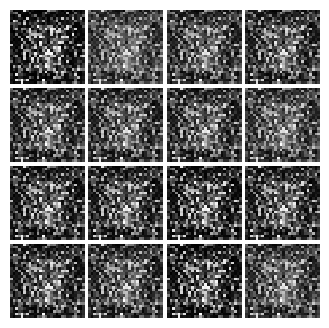

Epoch: 0, Iter: 180, D: 1.367, G:0.1825


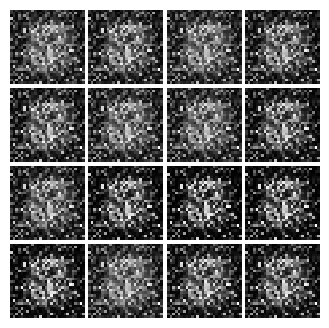

Epoch: 0, Iter: 200, D: 0.05356, G:0.4011


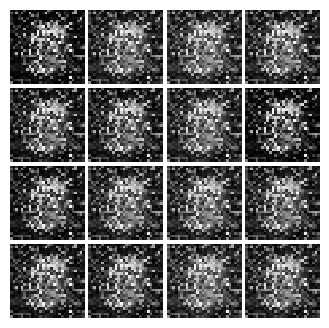

Epoch: 0, Iter: 220, D: 0.7646, G:0.7231


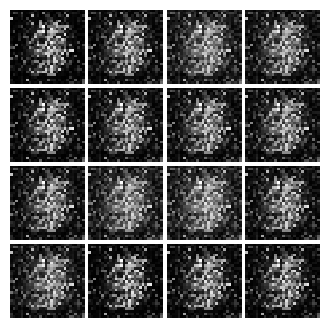

Epoch: 0, Iter: 240, D: 0.2079, G:0.8201


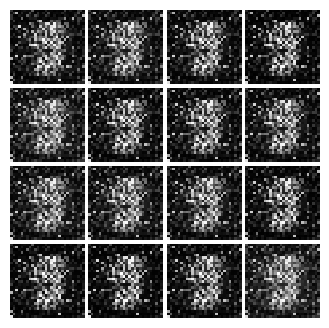

Epoch: 0, Iter: 260, D: 0.1389, G:0.3684


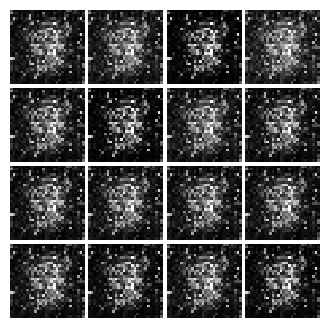

Epoch: 0, Iter: 280, D: 0.1178, G:0.3146


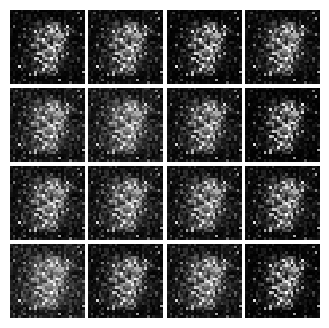

Epoch: 0, Iter: 300, D: 0.3097, G:0.5577


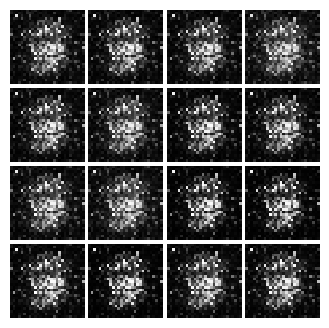

Epoch: 0, Iter: 320, D: 0.1393, G:0.7526


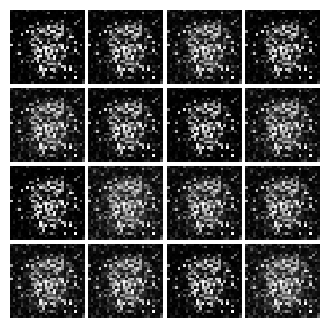

Epoch: 0, Iter: 340, D: 0.1239, G:0.4719


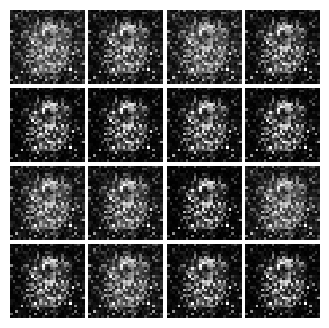

Epoch: 0, Iter: 360, D: 0.155, G:0.5959


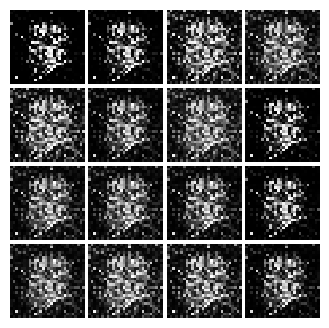

Epoch: 0, Iter: 380, D: 0.1459, G:0.3099


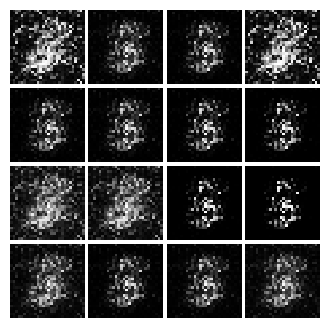

Epoch: 0, Iter: 400, D: 0.08052, G:0.5547


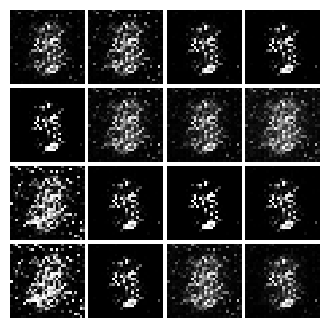

Epoch: 0, Iter: 420, D: 0.1726, G:0.5133


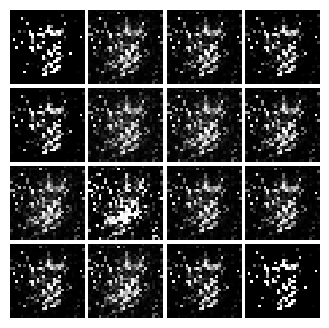

Epoch: 0, Iter: 440, D: 0.08156, G:0.3662


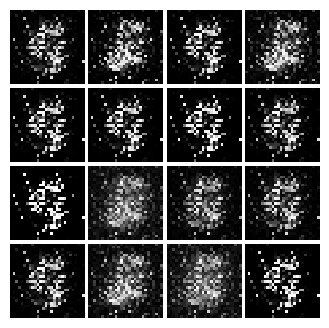

Epoch: 0, Iter: 460, D: 0.1133, G:0.4098


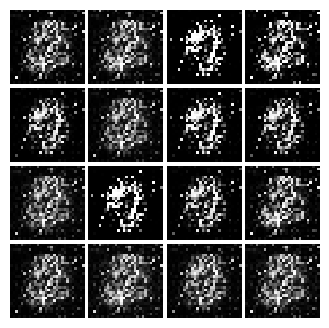

Epoch: 1, Iter: 480, D: 0.273, G:0.3906


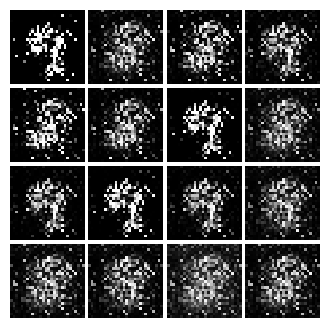

Epoch: 1, Iter: 500, D: 0.223, G:0.3151


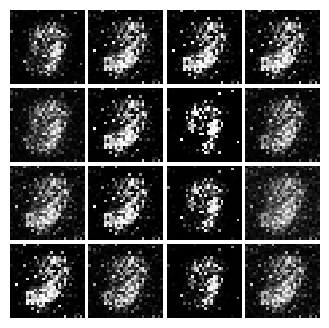

Epoch: 1, Iter: 520, D: 0.09903, G:0.3895


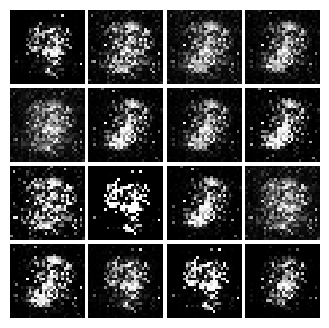

Epoch: 1, Iter: 540, D: 0.1389, G:0.447


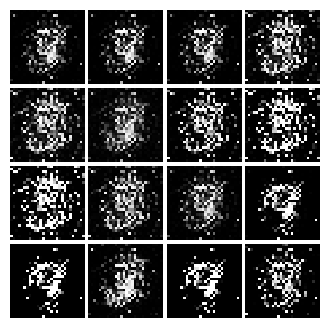

Epoch: 1, Iter: 560, D: 0.1384, G:0.5029


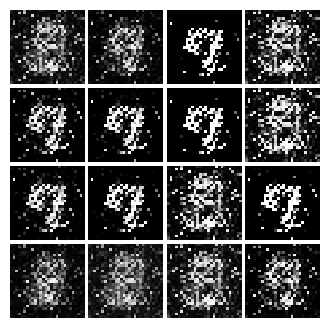

Epoch: 1, Iter: 580, D: 0.1554, G:0.3819


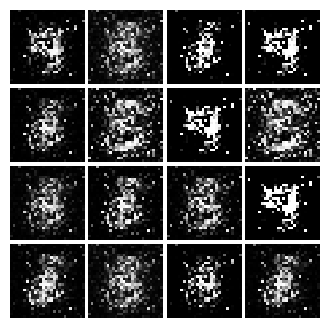

Epoch: 1, Iter: 600, D: 0.1841, G:0.3816


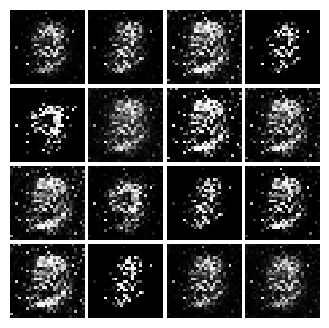

Epoch: 1, Iter: 620, D: 0.1962, G:0.6038


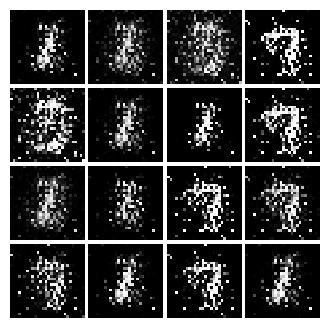

Epoch: 1, Iter: 640, D: 0.3803, G:0.03077


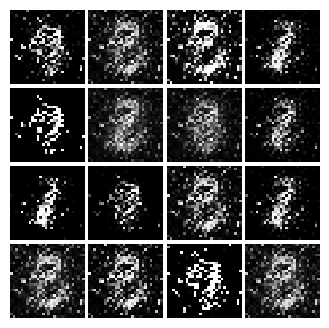

Epoch: 1, Iter: 660, D: 0.09467, G:0.7054


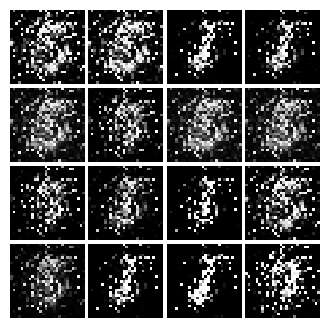

Epoch: 1, Iter: 680, D: 0.101, G:0.2996


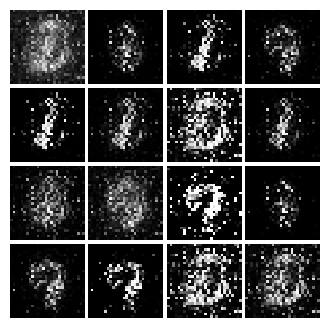

Epoch: 1, Iter: 700, D: 0.1237, G:0.3879


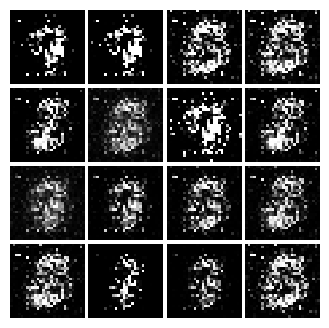

Epoch: 1, Iter: 720, D: 0.1333, G:0.4225


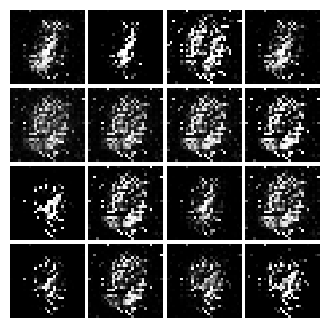

Epoch: 1, Iter: 740, D: 0.1182, G:0.4407


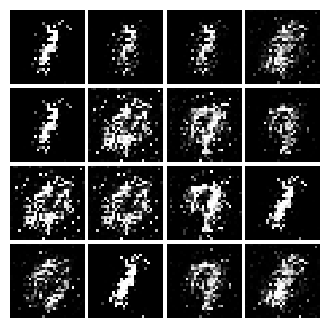

Epoch: 1, Iter: 760, D: 0.1967, G:0.6781


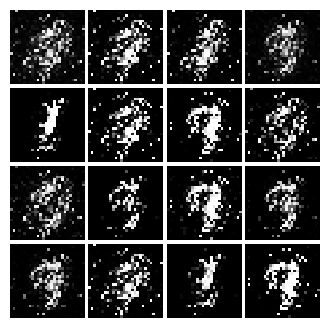

Epoch: 1, Iter: 780, D: 0.1303, G:0.1825


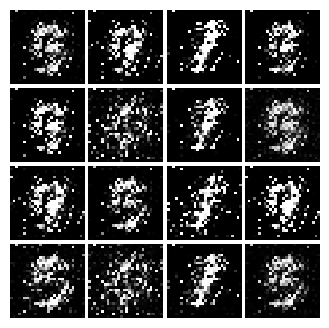

Epoch: 1, Iter: 800, D: 0.1766, G:0.5445


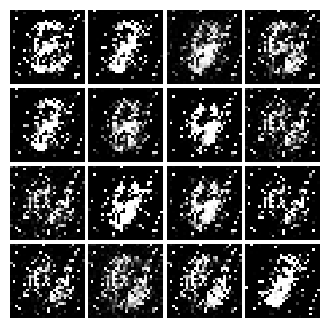

Epoch: 1, Iter: 820, D: 0.1552, G:0.4203


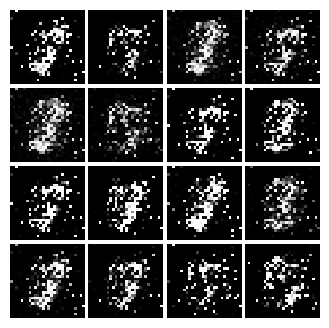

Epoch: 1, Iter: 840, D: 0.1651, G:0.1594


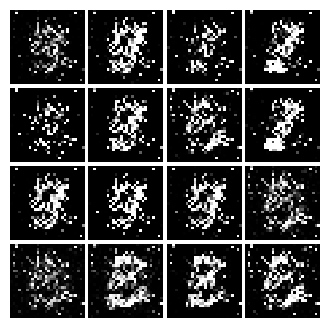

Epoch: 1, Iter: 860, D: 0.1142, G:0.6906


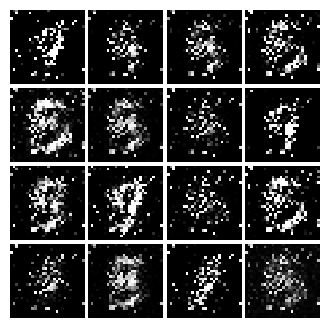

Epoch: 1, Iter: 880, D: 0.1402, G:0.4487


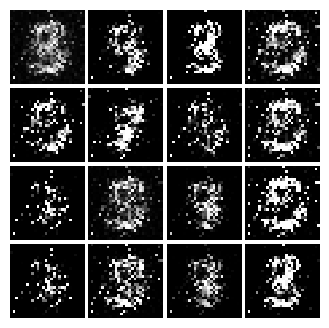

Epoch: 1, Iter: 900, D: 0.158, G:0.351


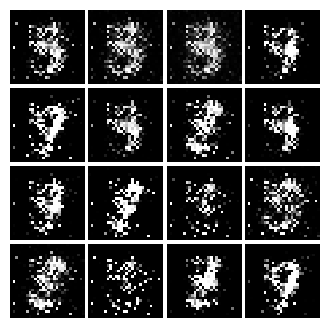

Epoch: 1, Iter: 920, D: 0.1505, G:0.2627


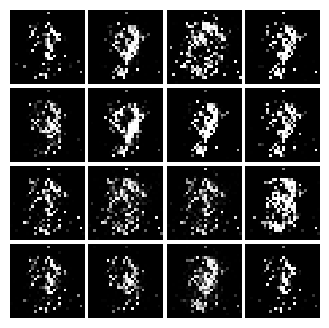

Epoch: 2, Iter: 940, D: 0.1366, G:0.3953


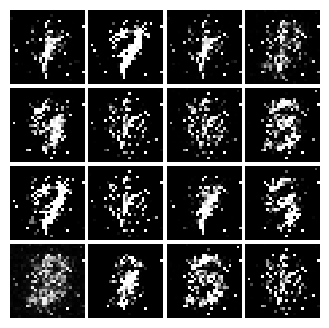

Epoch: 2, Iter: 960, D: 0.1714, G:0.7203


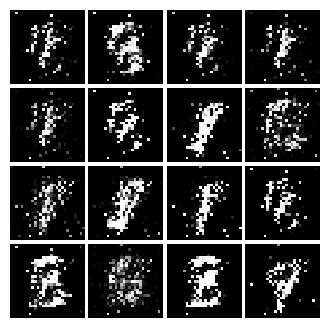

Epoch: 2, Iter: 980, D: 0.1086, G:0.4163


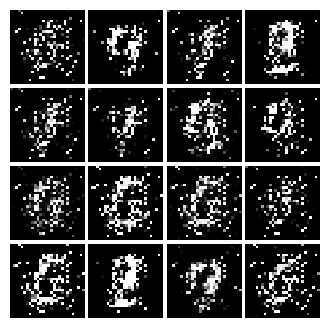

Epoch: 2, Iter: 1000, D: 0.3579, G:0.2585


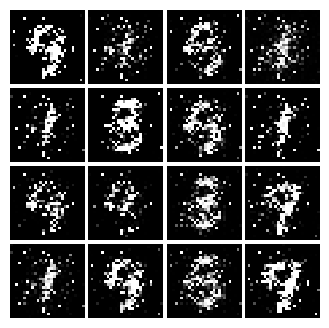

Epoch: 2, Iter: 1020, D: 0.1615, G:0.3703


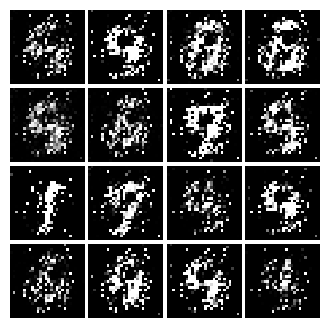

Epoch: 2, Iter: 1040, D: 0.1492, G:0.4635


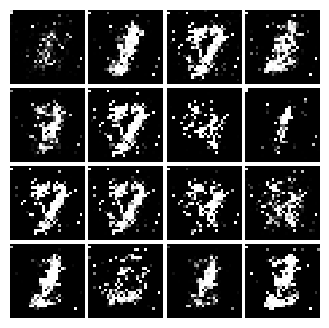

Epoch: 2, Iter: 1060, D: 0.1208, G:0.4483


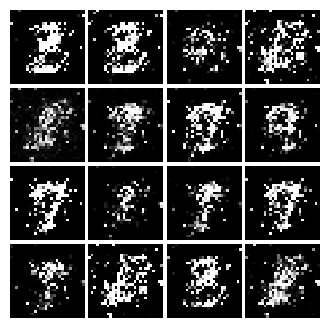

Epoch: 2, Iter: 1080, D: 0.269, G:0.2591


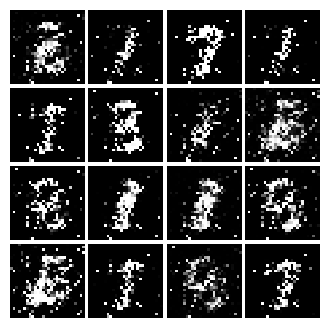

Epoch: 2, Iter: 1100, D: 0.1505, G:0.2352


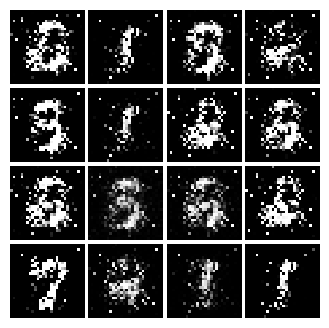

Epoch: 2, Iter: 1120, D: 0.1431, G:0.3043


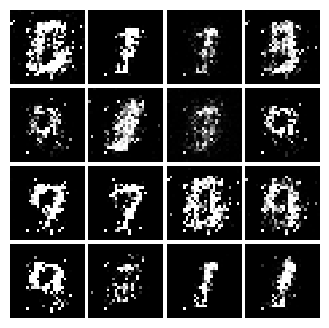

Epoch: 2, Iter: 1140, D: 0.3575, G:0.5566


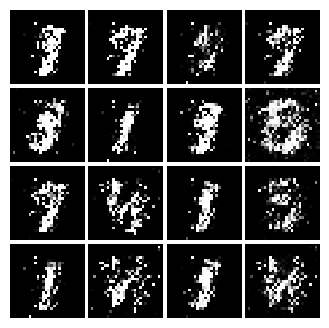

Epoch: 2, Iter: 1160, D: 0.1639, G:0.1215


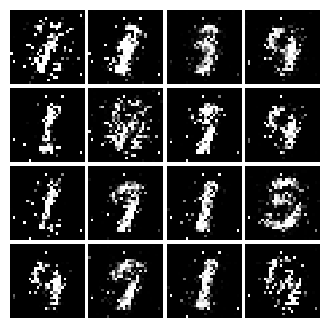

Epoch: 2, Iter: 1180, D: 0.1553, G:0.2677


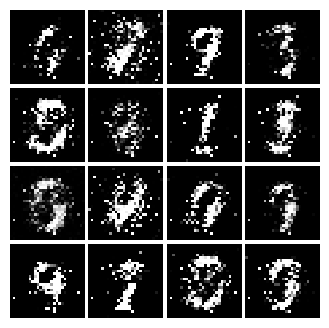

Epoch: 2, Iter: 1200, D: 0.1948, G:0.2653


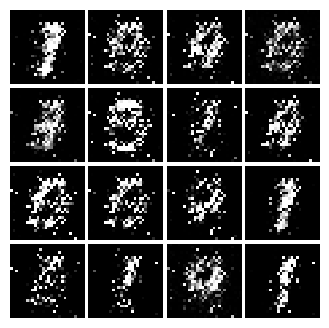

Epoch: 2, Iter: 1220, D: 0.1308, G:0.5648


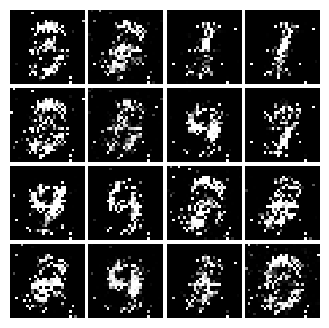

Epoch: 2, Iter: 1240, D: 0.1574, G:0.2924


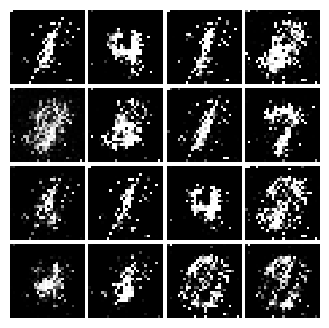

Epoch: 2, Iter: 1260, D: 0.1526, G:0.2971


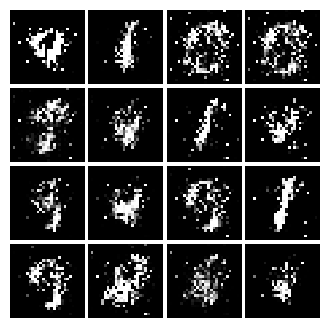

Epoch: 2, Iter: 1280, D: 0.1128, G:0.4181


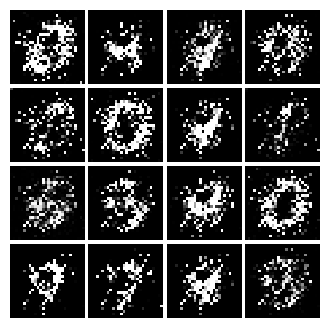

Epoch: 2, Iter: 1300, D: 0.1902, G:0.2636


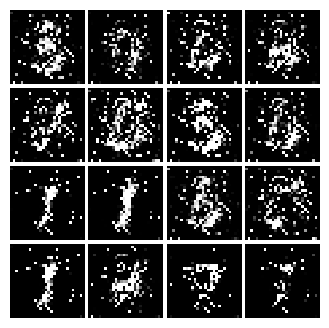

Epoch: 2, Iter: 1320, D: 0.1672, G:0.5518


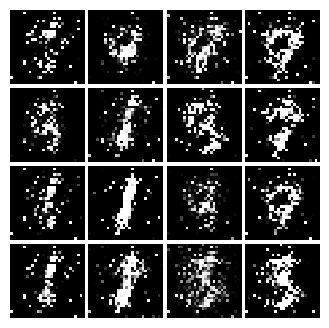

Epoch: 2, Iter: 1340, D: 0.1491, G:0.2571


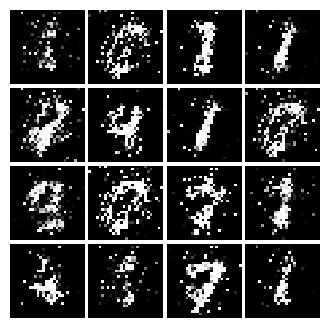

Epoch: 2, Iter: 1360, D: 0.1407, G:0.2113


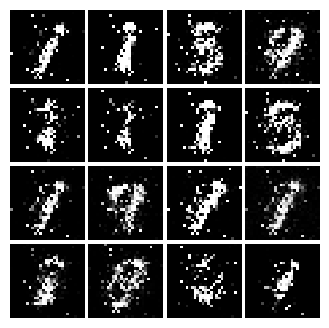

Epoch: 2, Iter: 1380, D: 0.15, G:0.06984


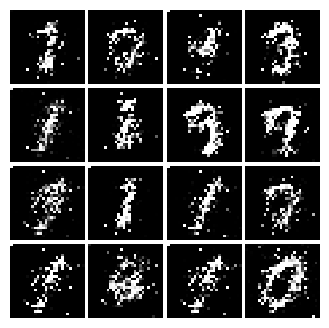

Epoch: 2, Iter: 1400, D: 0.1853, G:0.4317


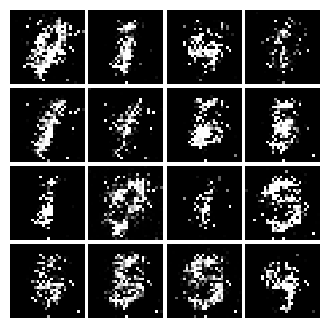

Epoch: 3, Iter: 1420, D: 0.1591, G:0.2274


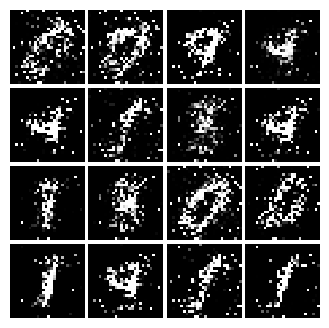

Epoch: 3, Iter: 1440, D: 0.1653, G:0.2635


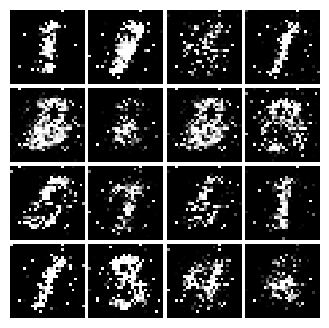

Epoch: 3, Iter: 1460, D: 0.211, G:0.1803


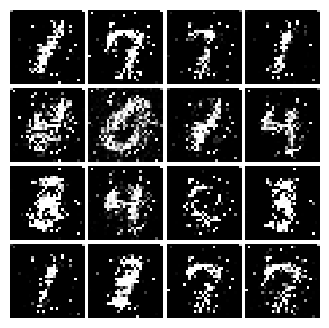

Epoch: 3, Iter: 1480, D: 0.2096, G:0.05042


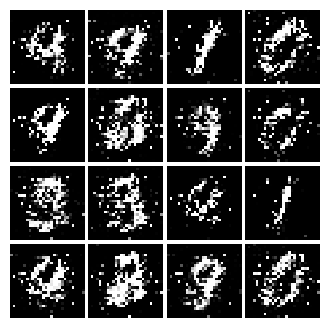

Epoch: 3, Iter: 1500, D: 0.1785, G:0.1651


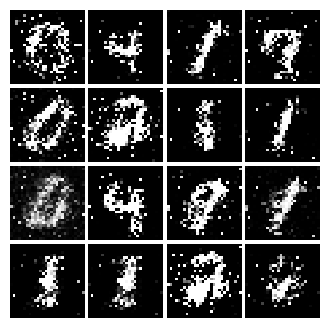

Epoch: 3, Iter: 1520, D: 0.165, G:0.2345


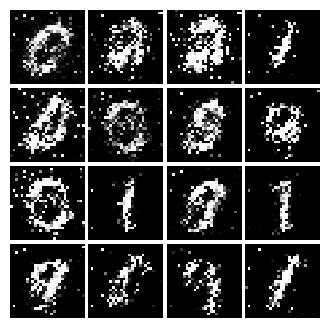

Epoch: 3, Iter: 1540, D: 0.1608, G:0.259


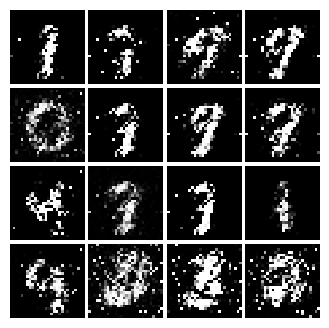

Epoch: 3, Iter: 1560, D: 0.2318, G:0.3117


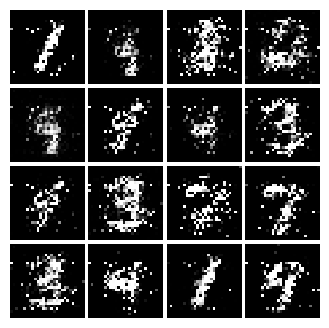

Epoch: 3, Iter: 1580, D: 0.1669, G:0.2463


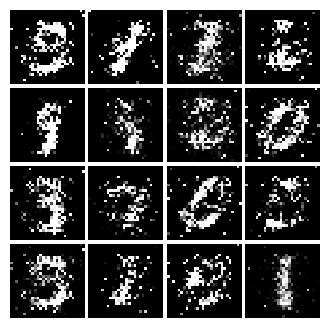

Epoch: 3, Iter: 1600, D: 0.2223, G:0.2455


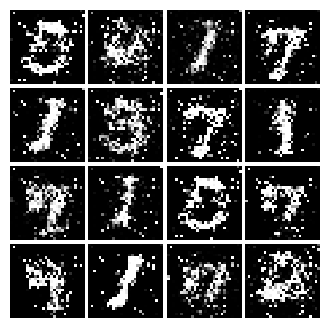

Epoch: 3, Iter: 1620, D: 0.1584, G:0.252


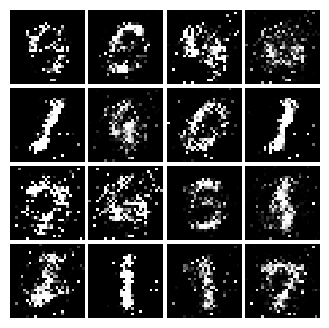

Epoch: 3, Iter: 1640, D: 0.1749, G:0.2371


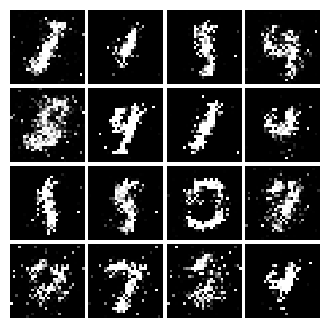

Epoch: 3, Iter: 1660, D: 0.3437, G:0.2403


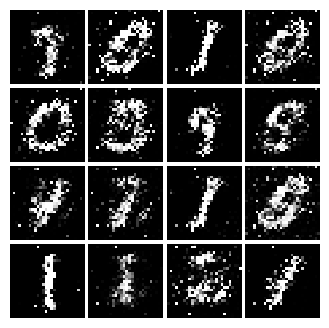

Epoch: 3, Iter: 1680, D: 0.2494, G:0.6286


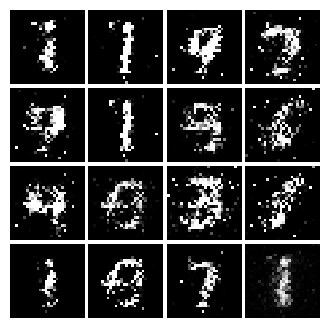

Epoch: 3, Iter: 1700, D: 0.1995, G:0.223


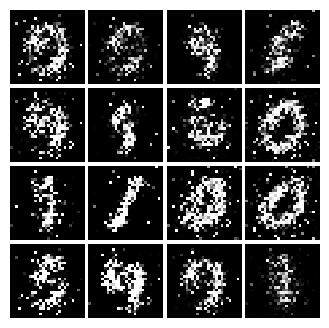

Epoch: 3, Iter: 1720, D: 0.1884, G:0.2092


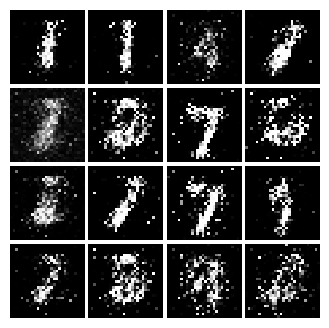

Epoch: 3, Iter: 1740, D: 0.1759, G:0.2177


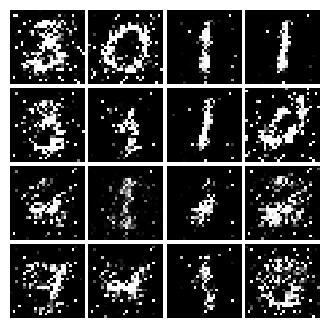

Epoch: 3, Iter: 1760, D: 0.1963, G:0.2018


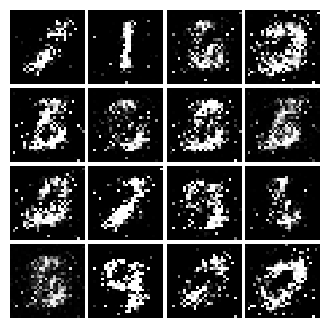

Epoch: 3, Iter: 1780, D: 0.136, G:0.2965


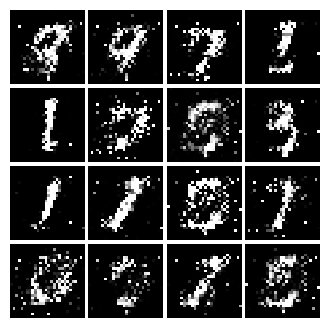

Epoch: 3, Iter: 1800, D: 0.2371, G:0.1886


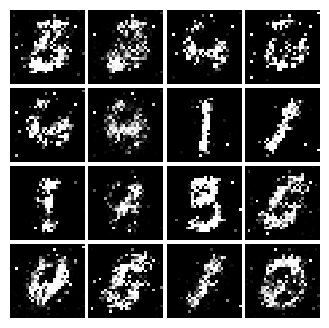

Epoch: 3, Iter: 1820, D: 0.2053, G:0.2053


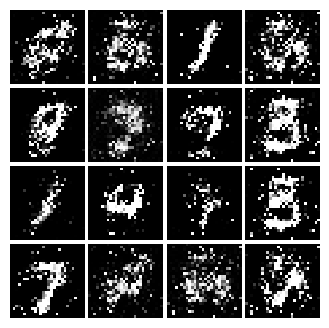

Epoch: 3, Iter: 1840, D: 0.1695, G:0.2608


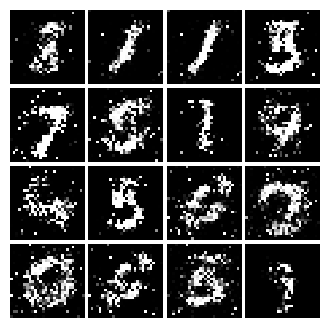

Epoch: 3, Iter: 1860, D: 0.1787, G:0.2498


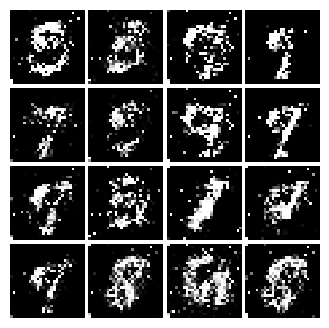

Epoch: 4, Iter: 1880, D: 0.2213, G:0.2895


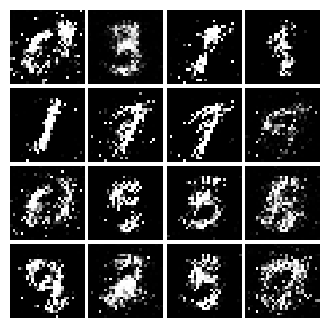

Epoch: 4, Iter: 1900, D: 0.203, G:0.2204


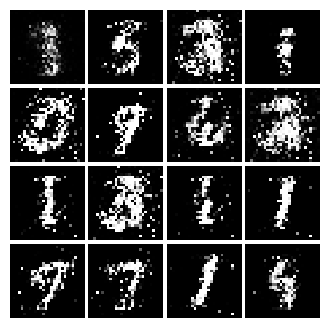

Epoch: 4, Iter: 1920, D: 0.1968, G:0.2359


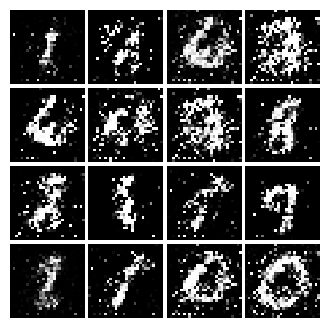

Epoch: 4, Iter: 1940, D: 0.17, G:0.2611


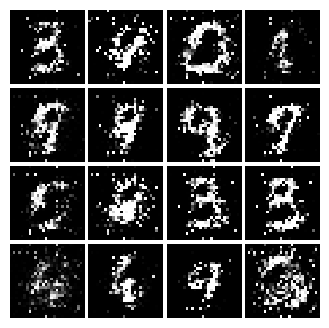

Epoch: 4, Iter: 1960, D: 0.268, G:0.04744


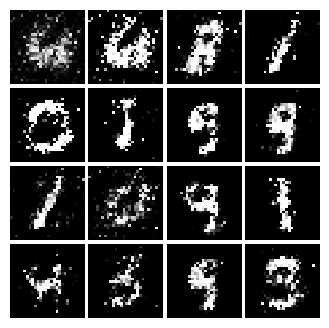

Epoch: 4, Iter: 1980, D: 0.1963, G:0.1901


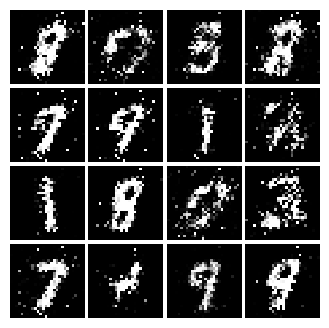

Epoch: 4, Iter: 2000, D: 0.1855, G:0.1845


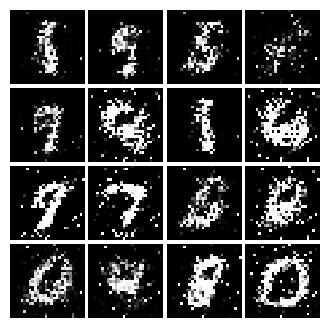

Epoch: 4, Iter: 2020, D: 0.1935, G:0.1941


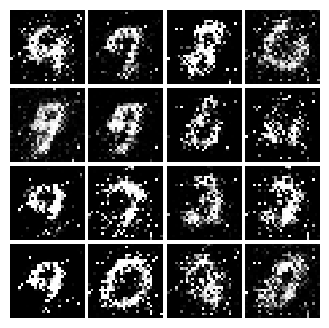

Epoch: 4, Iter: 2040, D: 0.1869, G:0.2195


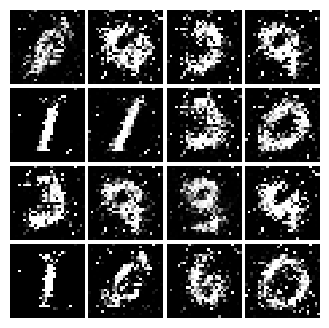

Epoch: 4, Iter: 2060, D: 0.197, G:0.2605


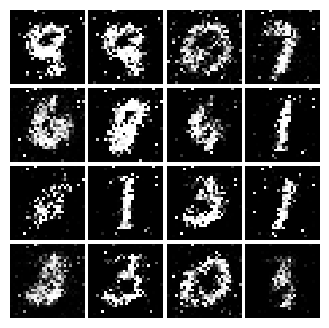

Epoch: 4, Iter: 2080, D: 0.2172, G:0.1839


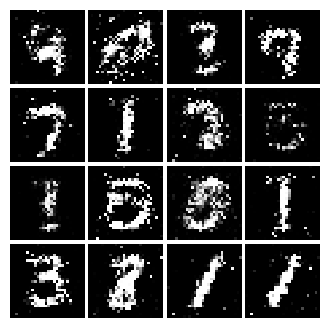

Epoch: 4, Iter: 2100, D: 0.2233, G:0.1842


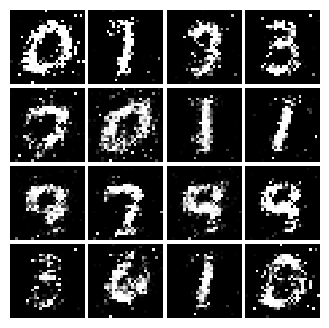

Epoch: 4, Iter: 2120, D: 0.2109, G:0.1837


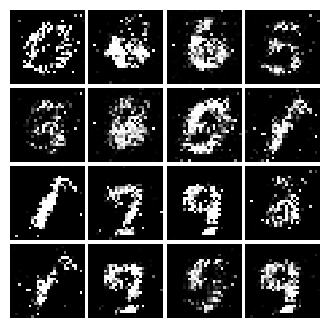

Epoch: 4, Iter: 2140, D: 0.182, G:0.2429


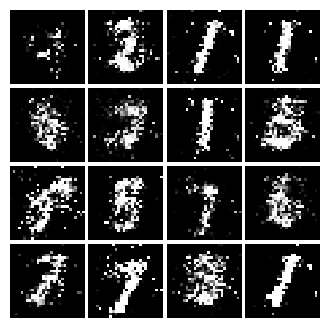

Epoch: 4, Iter: 2160, D: 0.2346, G:0.1698


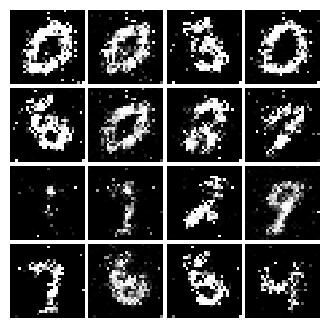

Epoch: 4, Iter: 2180, D: 0.2331, G:0.1578


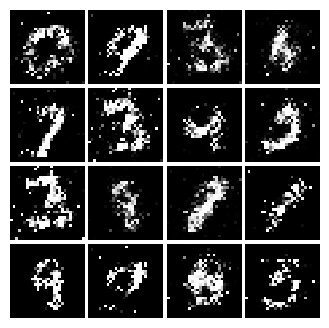

Epoch: 4, Iter: 2200, D: 0.1914, G:0.2201


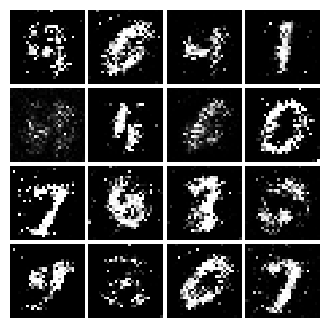

Epoch: 4, Iter: 2220, D: 0.2012, G:0.2068


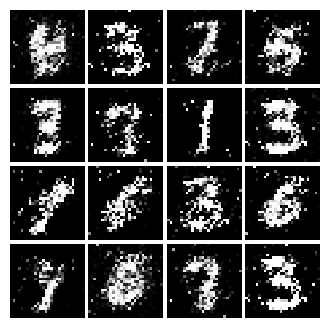

Epoch: 4, Iter: 2240, D: 0.2135, G:0.1873


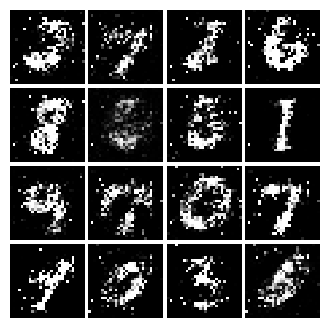

Epoch: 4, Iter: 2260, D: 0.2258, G:0.1897


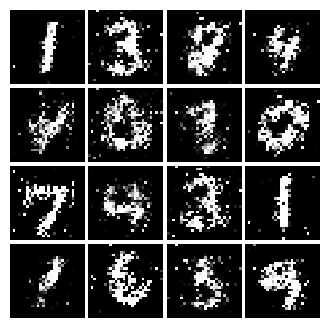

Epoch: 4, Iter: 2280, D: 0.2114, G:0.2013


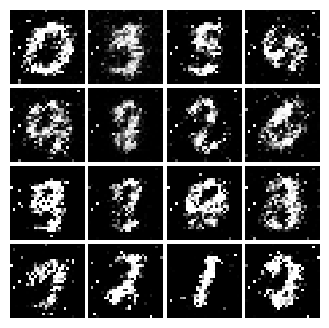

Epoch: 4, Iter: 2300, D: 0.2286, G:0.2003


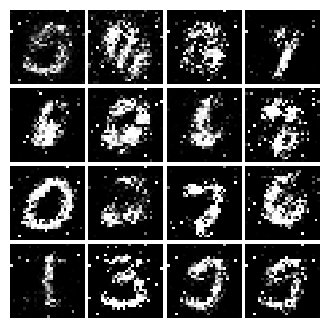

Epoch: 4, Iter: 2320, D: 0.2201, G:0.1869


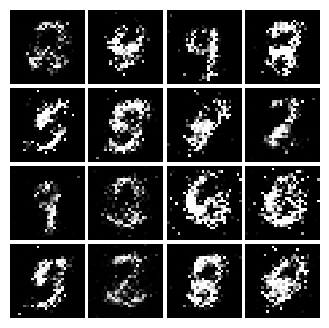

Epoch: 4, Iter: 2340, D: 0.226, G:0.1626


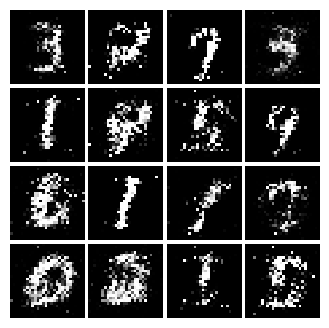

Epoch: 5, Iter: 2360, D: 0.2066, G:0.2565


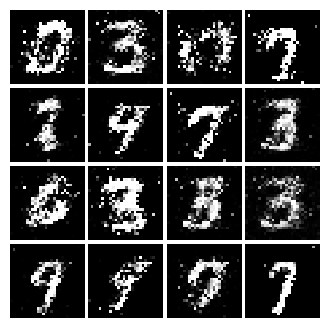

Epoch: 5, Iter: 2380, D: 0.2188, G:0.1654


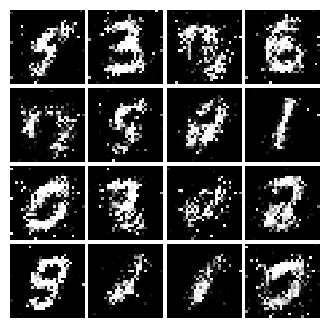

Epoch: 5, Iter: 2400, D: 0.2058, G:0.2073


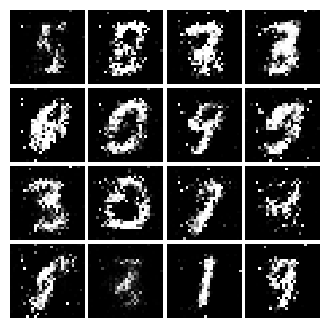

Epoch: 5, Iter: 2420, D: 0.1996, G:0.2134


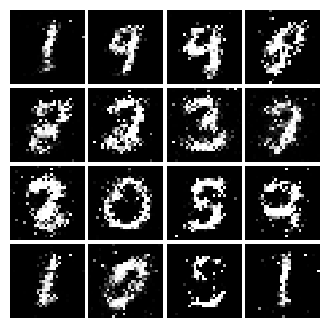

Epoch: 5, Iter: 2440, D: 0.2231, G:0.176


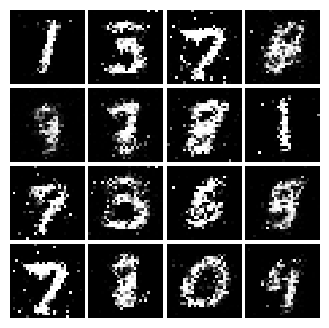

Epoch: 5, Iter: 2460, D: 0.2027, G:0.1811


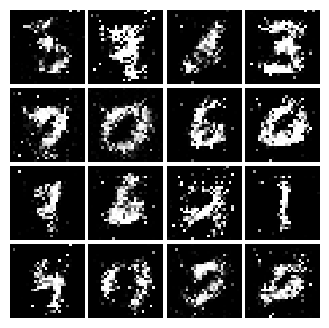

Epoch: 5, Iter: 2480, D: 0.2085, G:0.1804


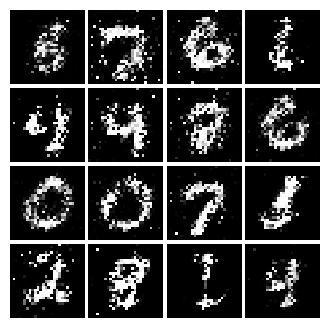

Epoch: 5, Iter: 2500, D: 0.1974, G:0.1887


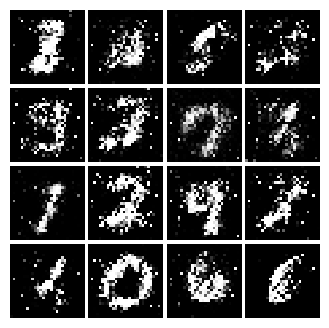

Epoch: 5, Iter: 2520, D: 0.2536, G:0.1521


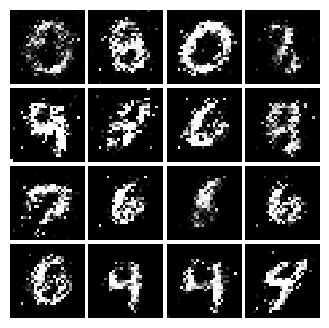

Epoch: 5, Iter: 2540, D: 0.2089, G:0.1749


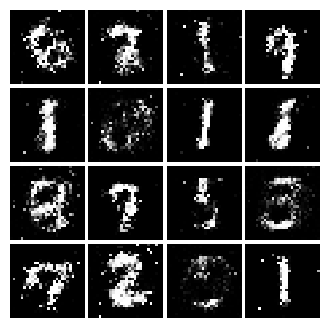

Epoch: 5, Iter: 2560, D: 0.2393, G:0.1645


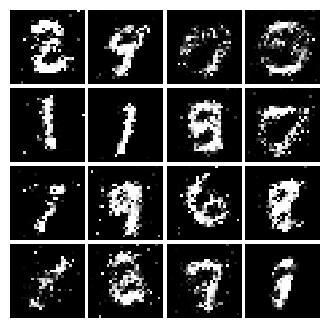

Epoch: 5, Iter: 2580, D: 0.2213, G:0.194


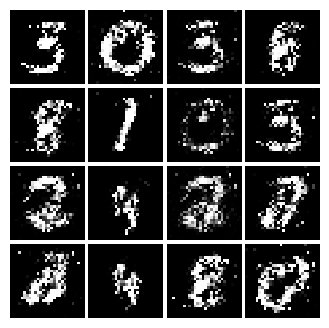

Epoch: 5, Iter: 2600, D: 0.246, G:0.1497


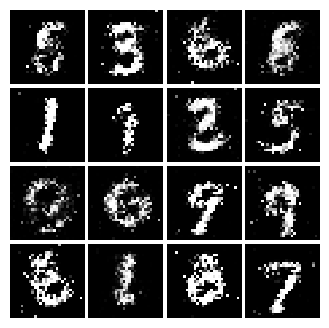

Epoch: 5, Iter: 2620, D: 0.243, G:0.1813


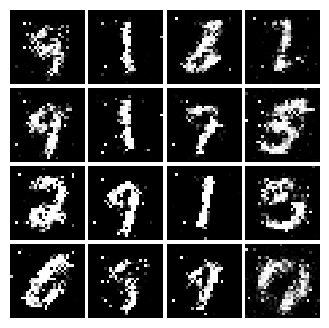

Epoch: 5, Iter: 2640, D: 0.2721, G:0.1927


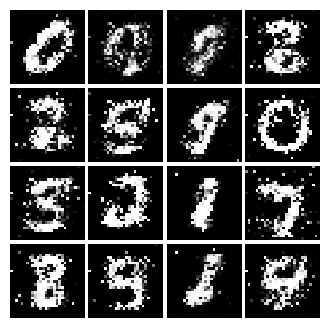

Epoch: 5, Iter: 2660, D: 0.2348, G:0.1649


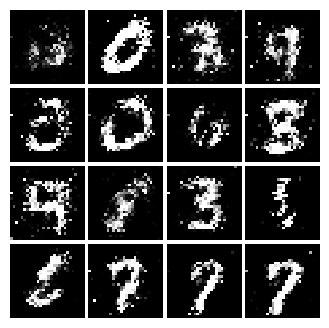

Epoch: 5, Iter: 2680, D: 0.2517, G:0.1855


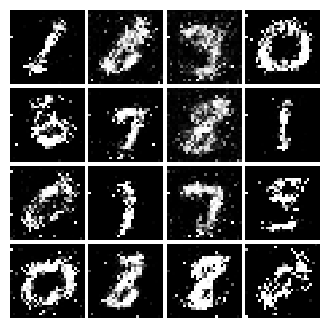

Epoch: 5, Iter: 2700, D: 0.2278, G:0.1848


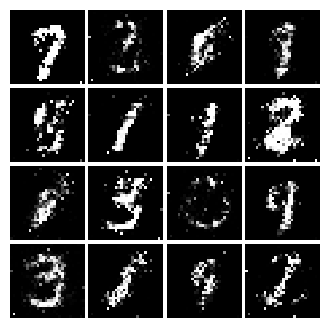

Epoch: 5, Iter: 2720, D: 0.2147, G:0.1782


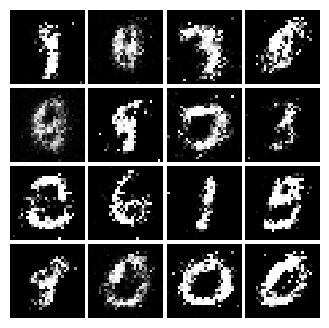

Epoch: 5, Iter: 2740, D: 0.2298, G:0.1762


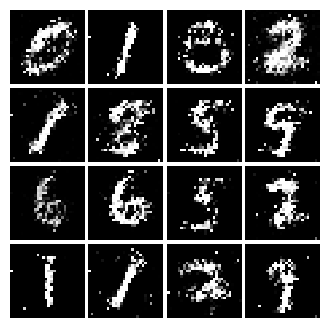

Epoch: 5, Iter: 2760, D: 0.2097, G:0.1623


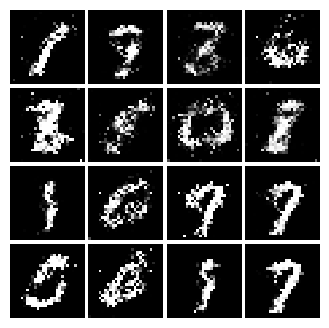

Epoch: 5, Iter: 2780, D: 0.2259, G:0.1531


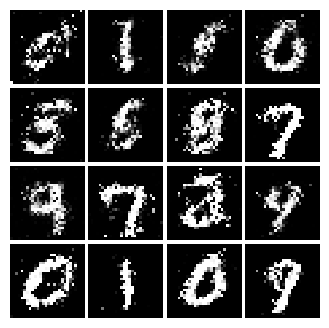

Epoch: 5, Iter: 2800, D: 0.1988, G:0.1808


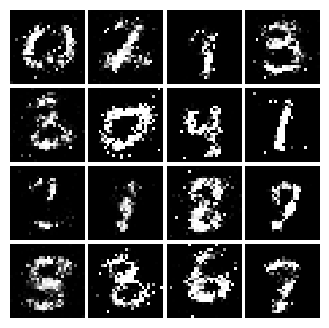

Epoch: 6, Iter: 2820, D: 0.237, G:0.1664


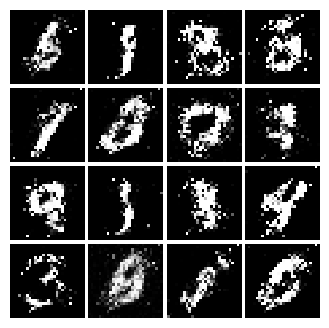

Epoch: 6, Iter: 2840, D: 0.2292, G:0.1498


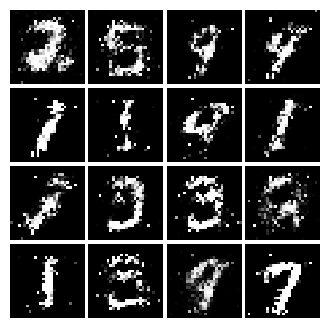

Epoch: 6, Iter: 2860, D: 0.2211, G:0.2063


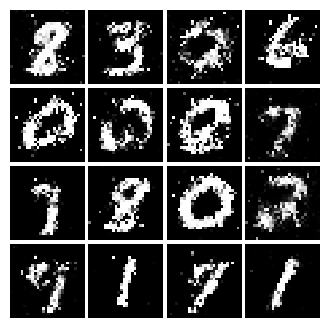

Epoch: 6, Iter: 2880, D: 0.2273, G:0.1843


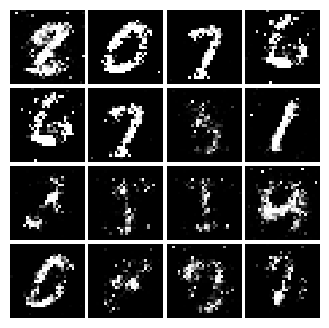

Epoch: 6, Iter: 2900, D: 0.2183, G:0.1712


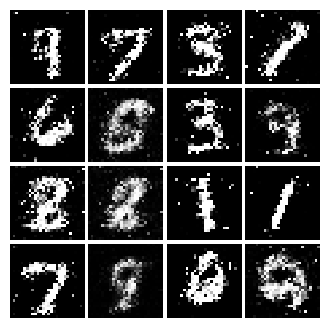

Epoch: 6, Iter: 2920, D: 0.2314, G:0.1586


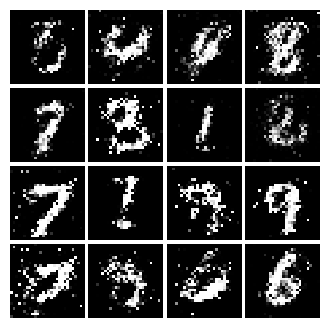

Epoch: 6, Iter: 2940, D: 0.2211, G:0.1671


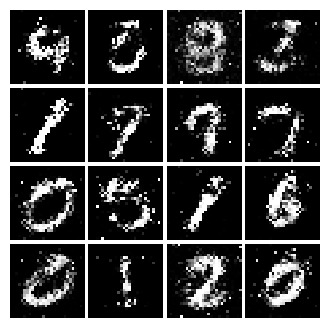

Epoch: 6, Iter: 2960, D: 0.2446, G:0.1446


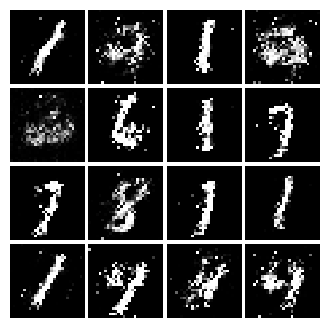

Epoch: 6, Iter: 2980, D: 0.2189, G:0.1645


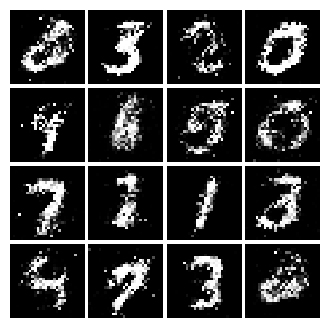

Epoch: 6, Iter: 3000, D: 0.233, G:0.1434


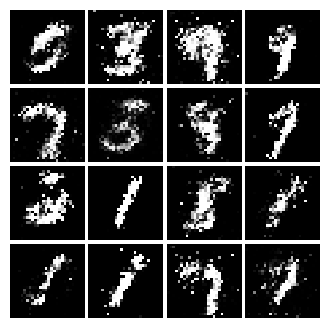

Epoch: 6, Iter: 3020, D: 0.2184, G:0.1736


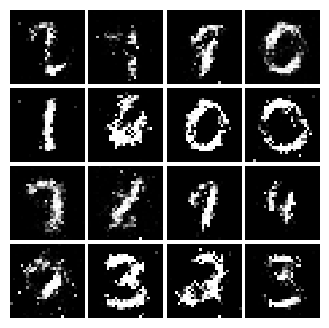

Epoch: 6, Iter: 3040, D: 0.2229, G:0.1849


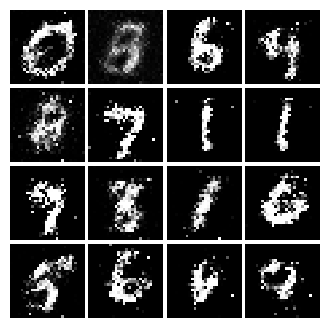

Epoch: 6, Iter: 3060, D: 0.2229, G:0.1778


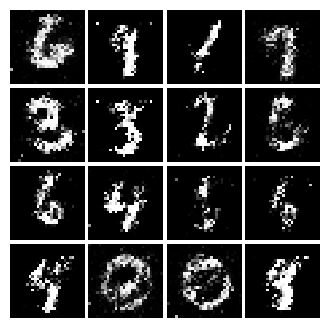

Epoch: 6, Iter: 3080, D: 0.2514, G:0.2042


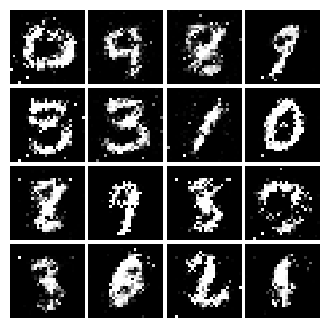

Epoch: 6, Iter: 3100, D: 0.2032, G:0.2006


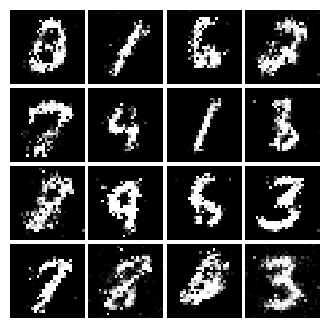

Epoch: 6, Iter: 3120, D: 0.2189, G:0.1531


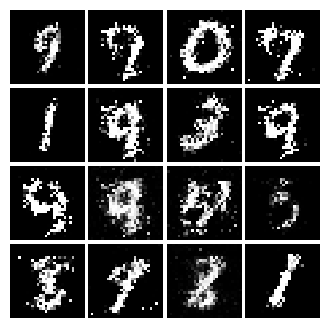

Epoch: 6, Iter: 3140, D: 0.2524, G:0.1795


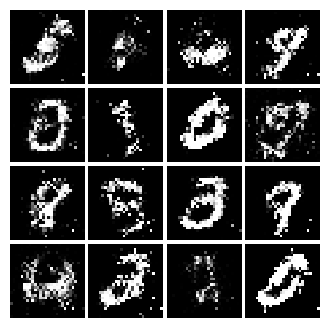

Epoch: 6, Iter: 3160, D: 0.223, G:0.1624


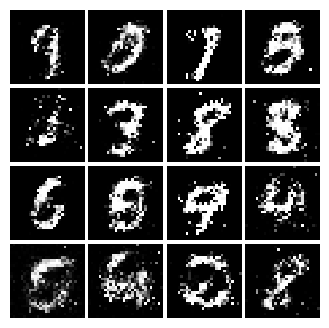

Epoch: 6, Iter: 3180, D: 0.2037, G:0.1817


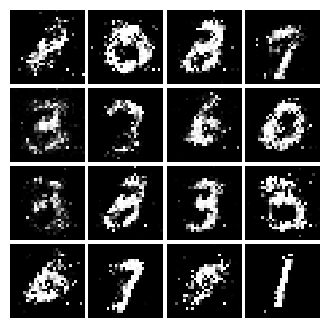

Epoch: 6, Iter: 3200, D: 0.2127, G:0.2103


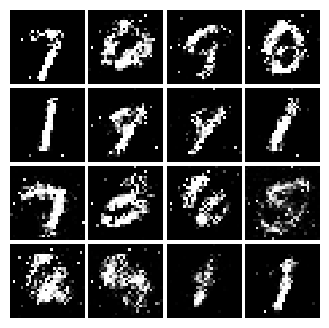

Epoch: 6, Iter: 3220, D: 0.2116, G:0.1997


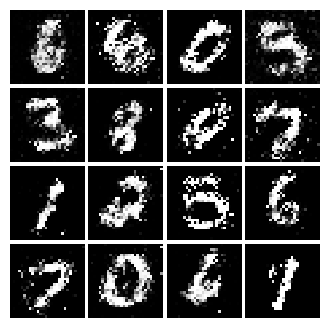

Epoch: 6, Iter: 3240, D: 0.2146, G:0.1791


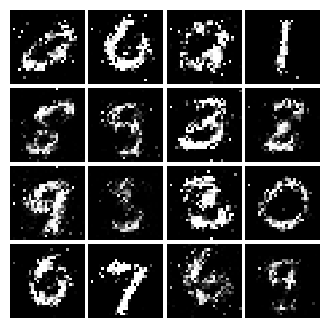

Epoch: 6, Iter: 3260, D: 0.2602, G:0.1559


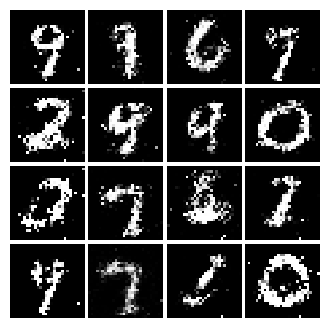

Epoch: 6, Iter: 3280, D: 0.2287, G:0.1706


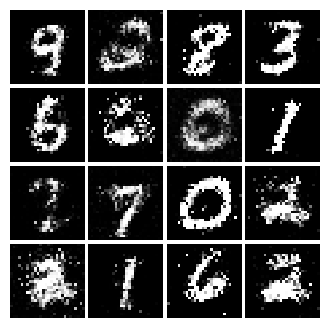

Epoch: 7, Iter: 3300, D: 0.2162, G:0.1936


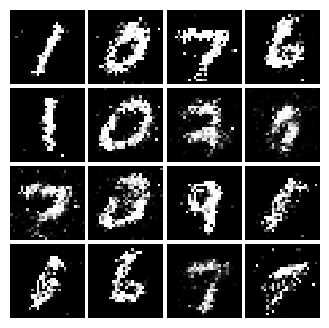

Epoch: 7, Iter: 3320, D: 0.1965, G:0.1958


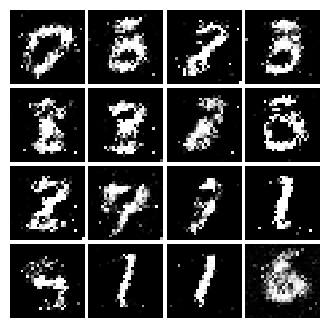

Epoch: 7, Iter: 3340, D: 0.2309, G:0.1993


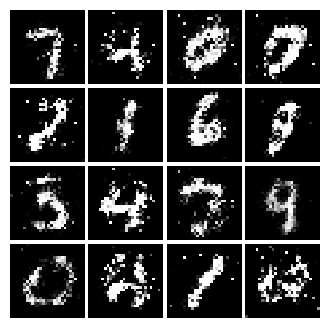

Epoch: 7, Iter: 3360, D: 0.2208, G:0.1835


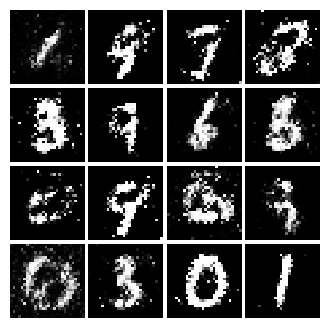

Epoch: 7, Iter: 3380, D: 0.2341, G:0.1534


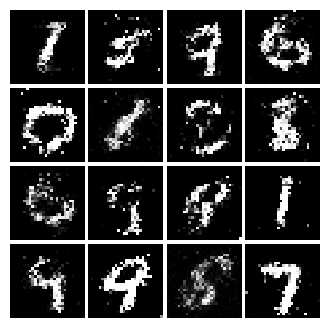

Epoch: 7, Iter: 3400, D: 0.2565, G:0.1663


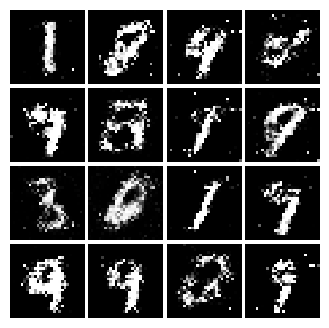

Epoch: 7, Iter: 3420, D: 0.2274, G:0.1826


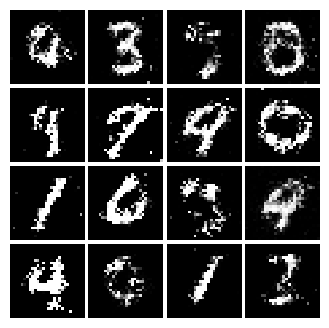

Epoch: 7, Iter: 3440, D: 0.2138, G:0.1934


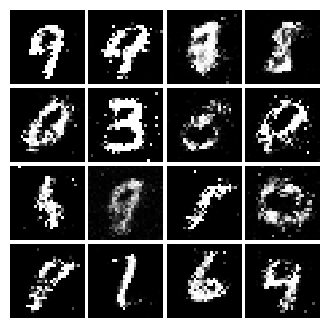

Epoch: 7, Iter: 3460, D: 0.2079, G:0.1927


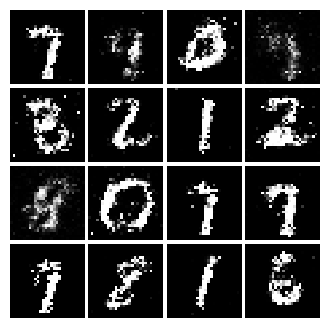

Epoch: 7, Iter: 3480, D: 0.2178, G:0.1573


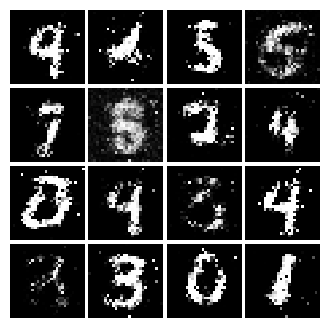

Epoch: 7, Iter: 3500, D: 0.2354, G:0.1572


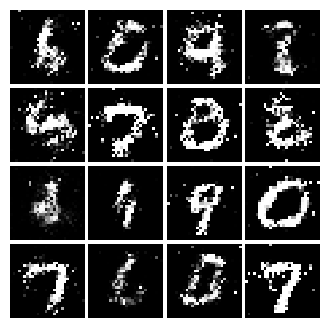

Epoch: 7, Iter: 3520, D: 0.2238, G:0.1544


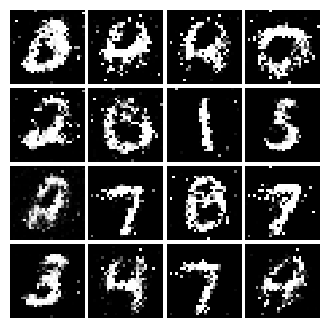

Epoch: 7, Iter: 3540, D: 0.2211, G:0.1756


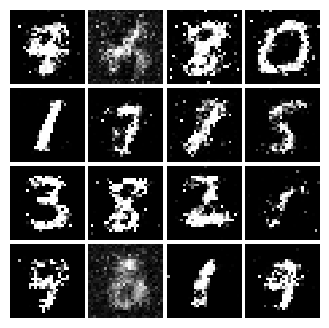

Epoch: 7, Iter: 3560, D: 0.2278, G:0.1976


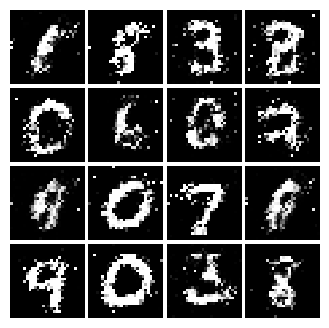

Epoch: 7, Iter: 3580, D: 0.2165, G:0.167


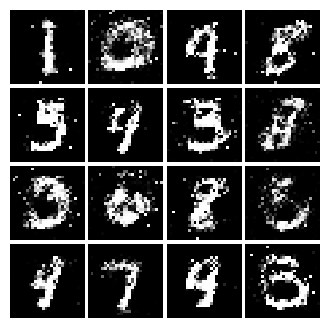

Epoch: 7, Iter: 3600, D: 0.2166, G:0.1769


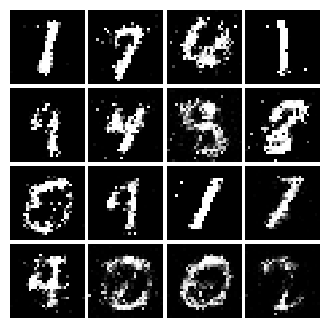

Epoch: 7, Iter: 3620, D: 0.2413, G:0.1877


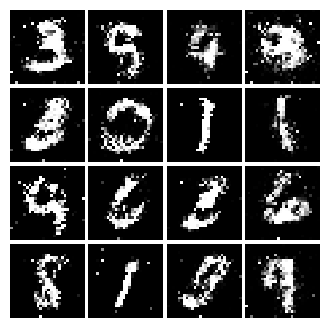

Epoch: 7, Iter: 3640, D: 0.2439, G:0.1745


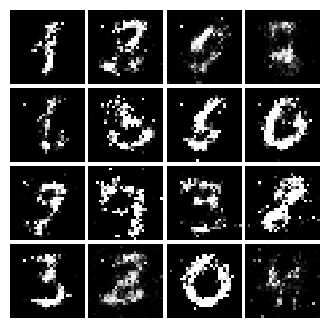

Epoch: 7, Iter: 3660, D: 0.2278, G:0.1823


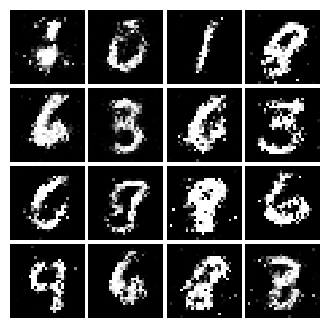

Epoch: 7, Iter: 3680, D: 0.2148, G:0.1807


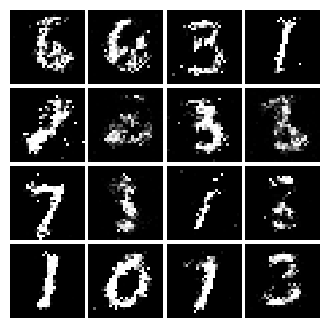

Epoch: 7, Iter: 3700, D: 0.225, G:0.2012


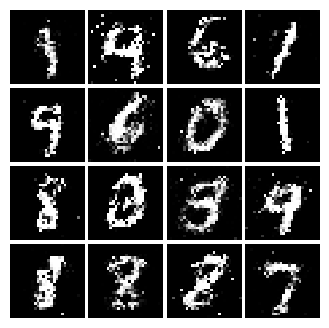

Epoch: 7, Iter: 3720, D: 0.2464, G:0.1494


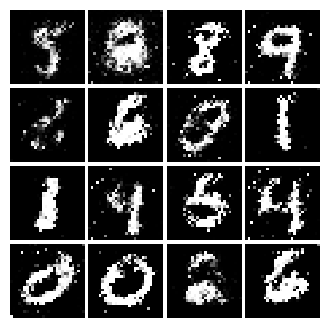

Epoch: 7, Iter: 3740, D: 0.2277, G:0.1562


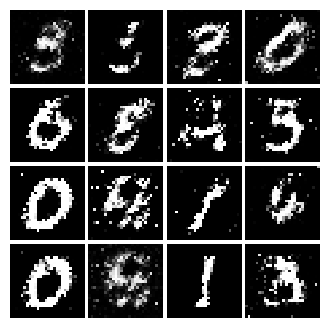

Epoch: 8, Iter: 3760, D: 0.2392, G:0.1919


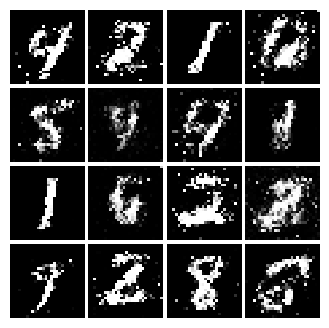

Epoch: 8, Iter: 3780, D: 0.2207, G:0.1899


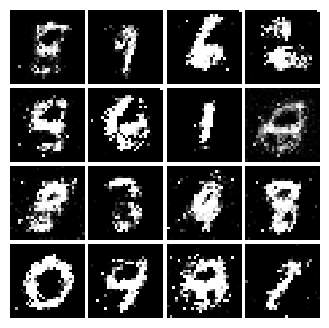

Epoch: 8, Iter: 3800, D: 0.2422, G:0.1876


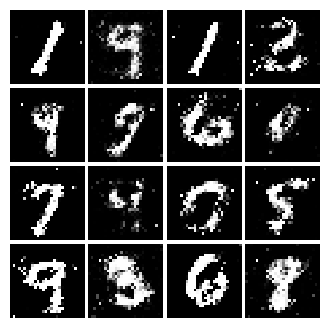

Epoch: 8, Iter: 3820, D: 0.2428, G:0.1619


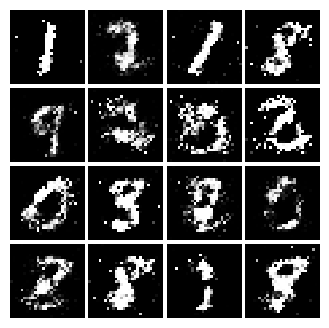

Epoch: 8, Iter: 3840, D: 0.2298, G:0.1599


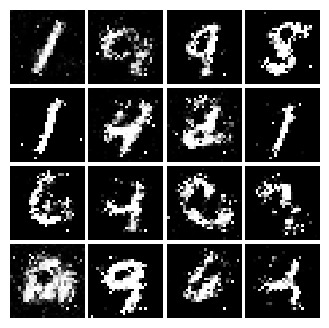

Epoch: 8, Iter: 3860, D: 0.2231, G:0.1846


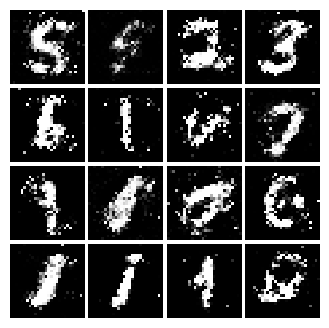

Epoch: 8, Iter: 3880, D: 0.2228, G:0.1611


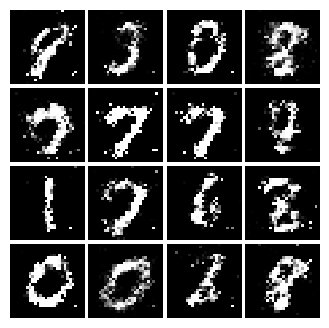

Epoch: 8, Iter: 3900, D: 0.2257, G:0.149


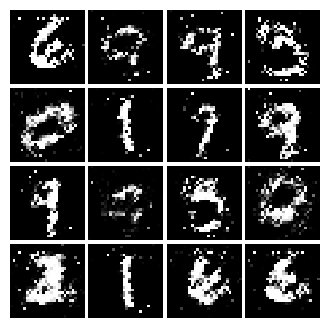

Epoch: 8, Iter: 3920, D: 0.2134, G:0.1831


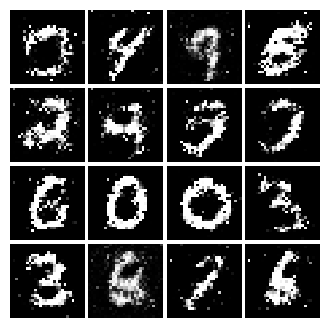

Epoch: 8, Iter: 3940, D: 0.2495, G:0.14


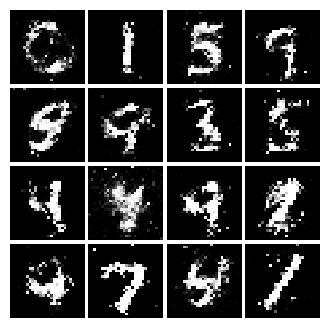

Epoch: 8, Iter: 3960, D: 0.2465, G:0.161


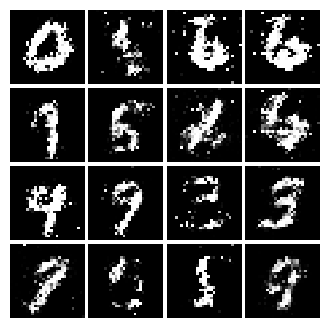

Epoch: 8, Iter: 3980, D: 0.2299, G:0.1772


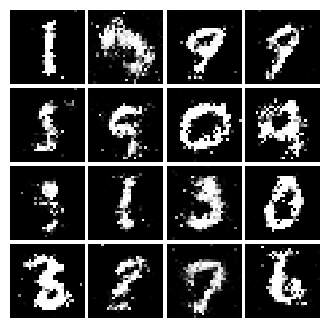

Epoch: 8, Iter: 4000, D: 0.2451, G:0.1637


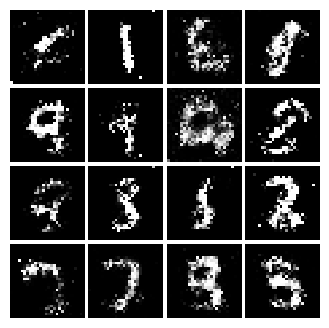

Epoch: 8, Iter: 4020, D: 0.2344, G:0.1617


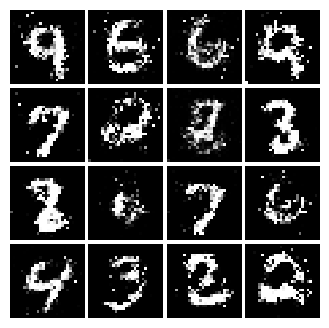

Epoch: 8, Iter: 4040, D: 0.2348, G:0.1637


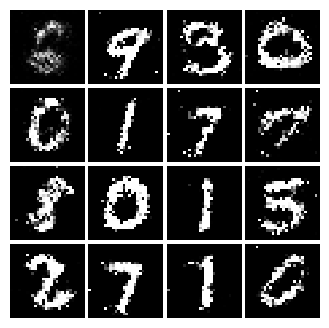

Epoch: 8, Iter: 4060, D: 0.2007, G:0.1609


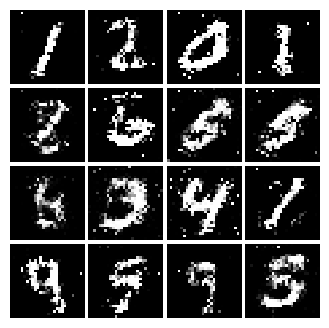

Epoch: 8, Iter: 4080, D: 0.2443, G:0.151


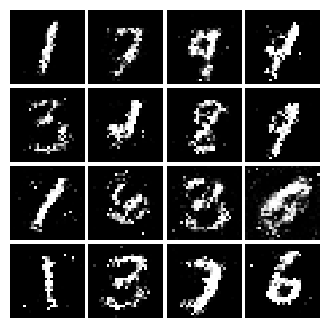

Epoch: 8, Iter: 4100, D: 0.2207, G:0.1674


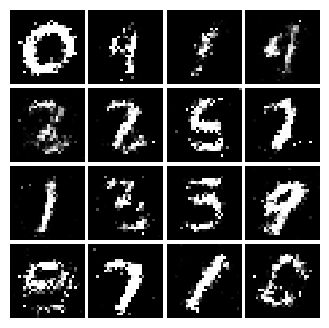

Epoch: 8, Iter: 4120, D: 0.2369, G:0.1524


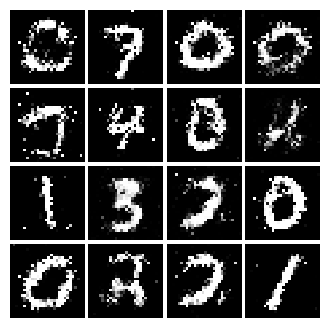

Epoch: 8, Iter: 4140, D: 0.2642, G:0.1924


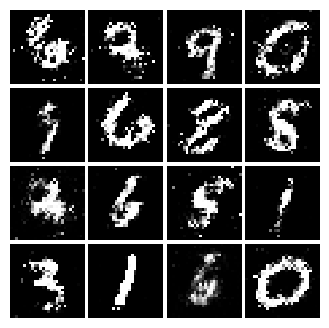

Epoch: 8, Iter: 4160, D: 0.2314, G:0.1585


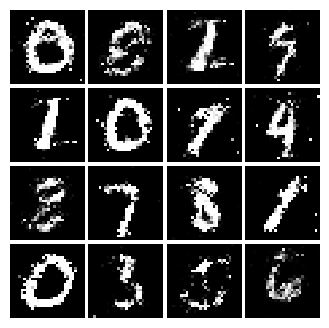

Epoch: 8, Iter: 4180, D: 0.2419, G:0.1666


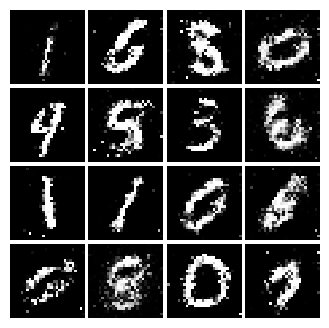

Epoch: 8, Iter: 4200, D: 0.2314, G:0.1421


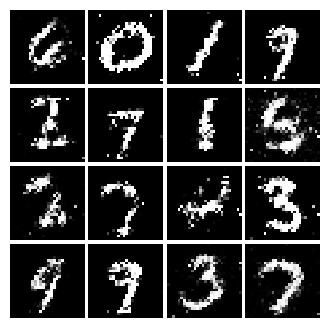

Epoch: 8, Iter: 4220, D: 0.2217, G:0.187


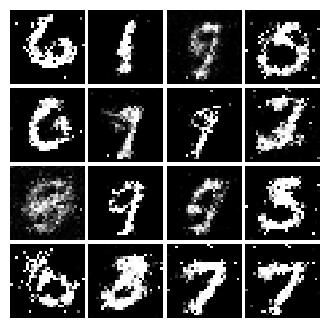

Epoch: 9, Iter: 4240, D: 0.2707, G:0.1451


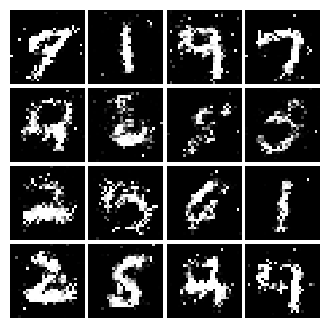

Epoch: 9, Iter: 4260, D: 0.2504, G:0.1618


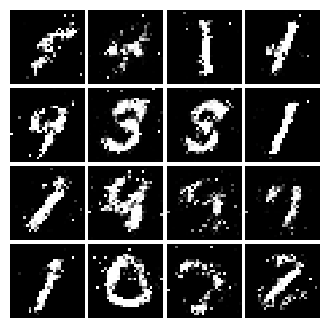

Epoch: 9, Iter: 4280, D: 0.2139, G:0.1635


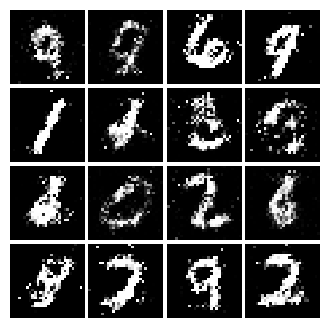

Epoch: 9, Iter: 4300, D: 0.2321, G:0.1598


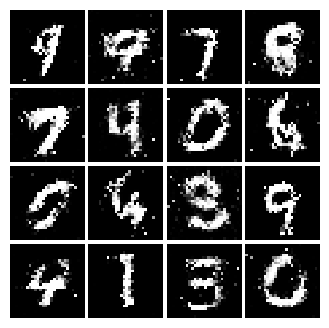

Epoch: 9, Iter: 4320, D: 0.2463, G:0.1659


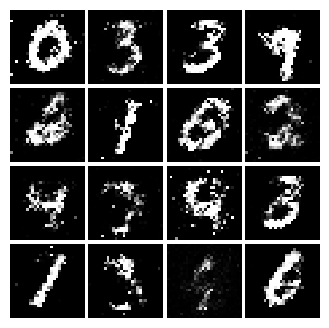

Epoch: 9, Iter: 4340, D: 0.2231, G:0.1717


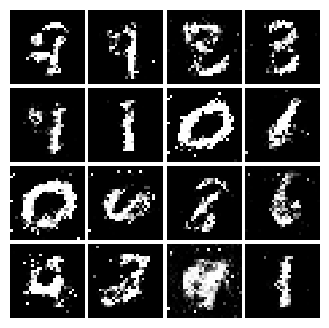

Epoch: 9, Iter: 4360, D: 0.2698, G:0.1569


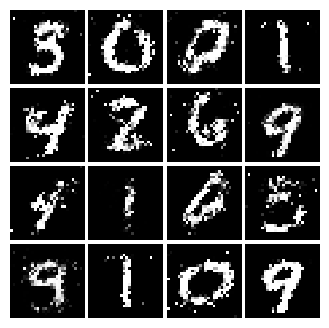

Epoch: 9, Iter: 4380, D: 0.2527, G:0.145


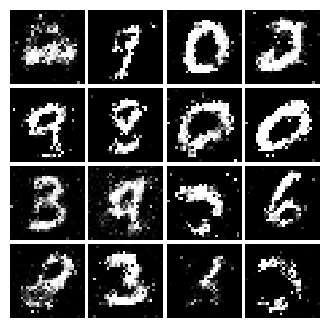

Epoch: 9, Iter: 4400, D: 0.2185, G:0.1712


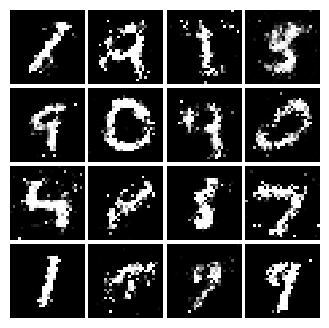

Epoch: 9, Iter: 4420, D: 0.2366, G:0.1917


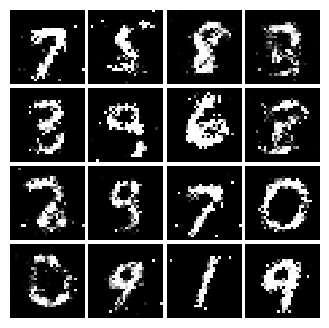

Epoch: 9, Iter: 4440, D: 0.2297, G:0.1455


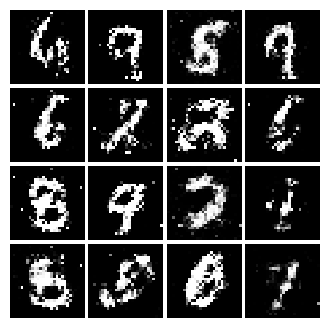

Epoch: 9, Iter: 4460, D: 0.2205, G:0.2033


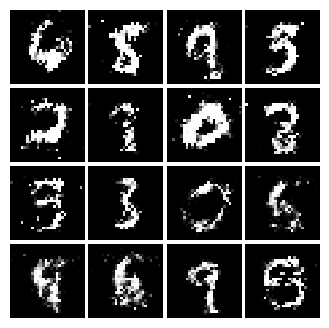

Epoch: 9, Iter: 4480, D: 0.2381, G:0.1462


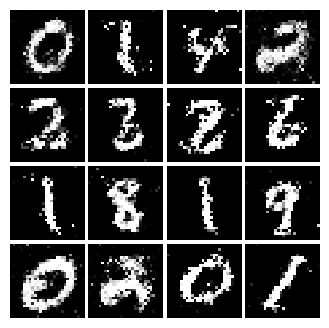

Epoch: 9, Iter: 4500, D: 0.2505, G:0.1525


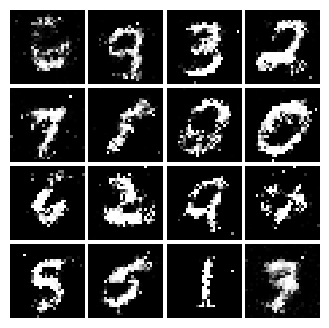

Epoch: 9, Iter: 4520, D: 0.2335, G:0.1582


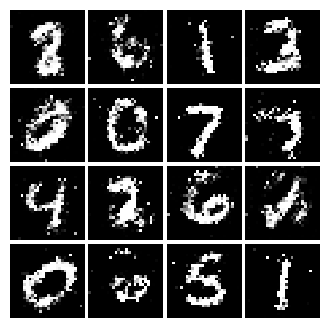

Epoch: 9, Iter: 4540, D: 0.2525, G:0.1618


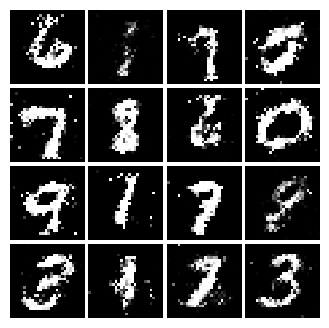

Epoch: 9, Iter: 4560, D: 0.2303, G:0.1588


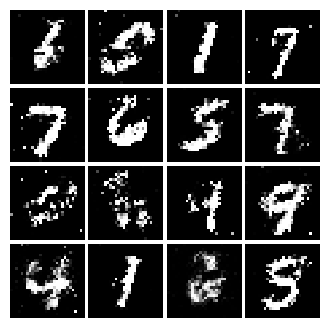

Epoch: 9, Iter: 4580, D: 0.2446, G:0.1762


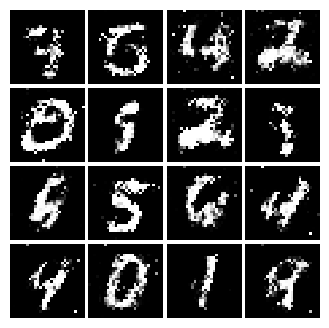

Epoch: 9, Iter: 4600, D: 0.2441, G:0.1621


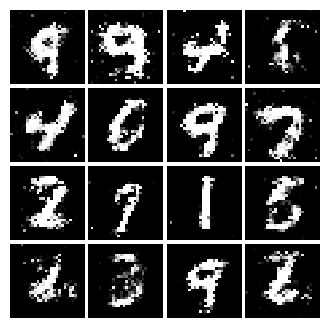

Epoch: 9, Iter: 4620, D: 0.2506, G:0.1411


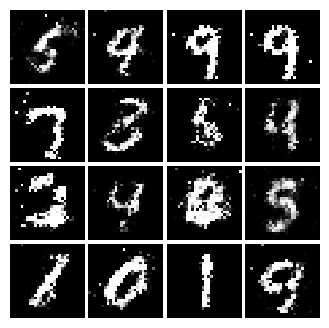

Epoch: 9, Iter: 4640, D: 0.2151, G:0.1753


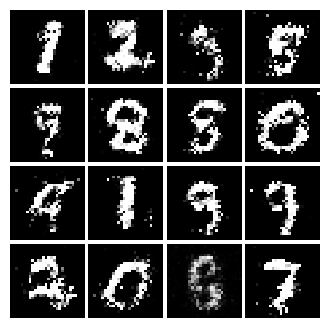

Epoch: 9, Iter: 4660, D: 0.2319, G:0.1827


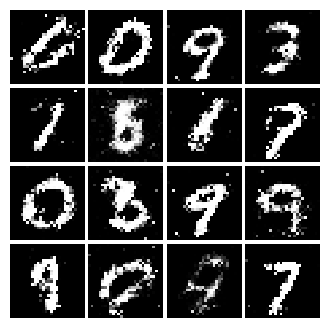

Epoch: 9, Iter: 4680, D: 0.2517, G:0.1508


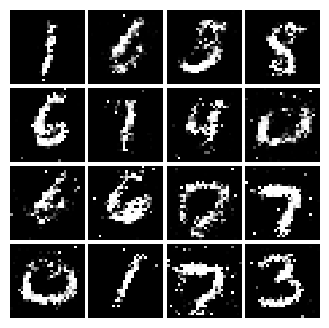

Final images


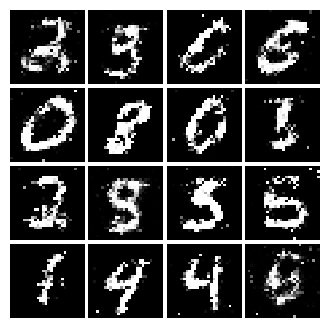

In [22]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, ls_generator_loss)

# Part II - Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [62]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################

        # Conv2D: 32 Filters, 5x5, Stride 1, padding 0
        tf.keras.layers.Conv2D(32, (5, 5), strides=(1, 1), padding='valid',
                               input_shape=(28, 28, 1)),

        # Leaky ReLU(alpha=0.01)
        tf.keras.layers.LeakyReLU(alpha=0.01),

        # Max Pool 2x2, Stride 2
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

        # Conv2D: 64 Filters, 5x5, Stride 1, padding 0
        tf.keras.layers.Conv2D(64, (5, 5), strides=(1, 1), padding='valid'),

        # Leaky ReLU(alpha=0.01)
        tf.keras.layers.LeakyReLU(alpha=0.01),

        # Max Pool 2x2, Stride 2
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

        # Flatten
        tf.keras.layers.Flatten(),

        # Fully Connected with output size 4 x 4 x 64
        tf.keras.layers.Dense(4*4*64),

        # Leaky ReLU(alpha=0.01)
        tf.keras.layers.LeakyReLU(alpha=0.01),

        # Fully Connected with output size 1
        tf.keras.layers.Dense(1)

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
    ])

    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [64]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################

        # Fully connected with output size 1024
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),

        # ReLU
        tf.keras.layers.ReLU(),

        # BatchNorm
        tf.keras.layers.BatchNormalization(),

        # Fully connected with output size 7 x 7 x 128
        tf.keras.layers.Dense(7*7*128),

        # ReLU
        tf.keras.layers.ReLU(),

        # BatchNorm
        tf.keras.layers.BatchNormalization(),

        # Resize into Image Tensor of size 7, 7, 128
        tf.keras.layers.Reshape((7, 7, 128)),

        # Conv2D^T (transpose): 64 filters of 4x4, stride 2
        tf.keras.layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'),

        # ReLU
        tf.keras.layers.ReLU(),

        # BatchNorm
        tf.keras.layers.BatchNormalization(),

        # Conv2d^T (transpose): 1 filter of 4x4, stride 2
        tf.keras.layers.Conv2DTranspose(1, (4, 4), strides=(2, 2), padding='same'),

        # TanH
        tf.keras.layers.Activation('tanh')

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
    ])

    return model

test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss, num_epochs=5)

# OPTIONAL: Part III - Sequence-to-Sequence Generative Model

Research and experiment on architecture and training of a sequence-to-sequence autoencoders and generative model for task such as language translation. Below are example tutorials:

- https://keras.io/examples/nlp/lstm_seq2seq/
- https://keras.io/examples/nlp/neural_machine_translation_with_transformer/

In [ ]:
import pathlib
import random
import string
import re
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import TextVectorization

In [ ]:
text_file = keras.utils.get_file(
    fname="spa-eng.zip",
    origin="http://storage.googleapis.com/download.tensorflow.org/data/spa-eng.zip",
    extract=True,
)
text_file = pathlib.Path(text_file).parent / "spa-eng" / "spa.txt"

In [ ]:
with open(text_file) as f:
    lines = f.read().split("\n")[:-1]
text_pairs = []
for line in lines:
    eng, spa = line.split("\t")
    spa = "[start] " + spa + " [end]"
    text_pairs.append((eng, spa))

In [ ]:
for _ in range(5):
    print(random.choice(text_pairs))

In [ ]:
random.shuffle(text_pairs)
num_val_samples = int(0.15 * len(text_pairs))
num_train_samples = len(text_pairs) - 2 * num_val_samples
train_pairs = text_pairs[:num_train_samples]
val_pairs = text_pairs[num_train_samples : num_train_samples + num_val_samples]
test_pairs = text_pairs[num_train_samples + num_val_samples :]

print(f"{len(text_pairs)} total pairs")
print(f"{len(train_pairs)} training pairs")
print(f"{len(val_pairs)} validation pairs")
print(f"{len(test_pairs)} test pairs")

In [ ]:
strip_chars = string.punctuation + "¿"
strip_chars = strip_chars.replace("[", "")
strip_chars = strip_chars.replace("]", "")

vocab_size = 15000
sequence_length = 20
batch_size = 64


def custom_standardization(input_string):
    lowercase = tf.strings.lower(input_string)
    return tf.strings.regex_replace(lowercase, "[%s]" % re.escape(strip_chars), "")


eng_vectorization = TextVectorization(
    max_tokens=vocab_size,
    output_mode="int",
    output_sequence_length=sequence_length,
)
spa_vectorization = TextVectorization(
    max_tokens=vocab_size,
    output_mode="int",
    output_sequence_length=sequence_length + 1,
    standardize=custom_standardization,
)
train_eng_texts = [pair[0] for pair in train_pairs]
train_spa_texts = [pair[1] for pair in train_pairs]
eng_vectorization.adapt(train_eng_texts)
spa_vectorization.adapt(train_spa_texts)

In [ ]:
def format_dataset(eng, spa):
    eng = eng_vectorization(eng)
    spa = spa_vectorization(spa)
    return (
        {
            "encoder_inputs": eng,
            "decoder_inputs": spa[:, :-1],
        },
        spa[:, 1:],
    )


def make_dataset(pairs):
    eng_texts, spa_texts = zip(*pairs)
    eng_texts = list(eng_texts)
    spa_texts = list(spa_texts)
    dataset = tf.data.Dataset.from_tensor_slices((eng_texts, spa_texts))
    dataset = dataset.batch(batch_size)
    dataset = dataset.map(format_dataset)
    return dataset.shuffle(2048).prefetch(16).cache()


train_ds = make_dataset(train_pairs)
val_ds = make_dataset(val_pairs)

In [ ]:
for inputs, targets in train_ds.take(1):
    print(f'inputs["encoder_inputs"].shape: {inputs["encoder_inputs"].shape}')
    print(f'inputs["decoder_inputs"].shape: {inputs["decoder_inputs"].shape}')
    print(f"targets.shape: {targets.shape}")

In [ ]:
class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads
        self.attention = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim
        )
        self.dense_proj = keras.Sequential(
            [
                layers.Dense(dense_dim, activation="relu"),
                layers.Dense(embed_dim),
            ]
        )
        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()
        self.supports_masking = True

    def call(self, inputs, mask=None):
        attention_output = self.attention(query=inputs, value=inputs, key=inputs)
        proj_input = self.layernorm_1(inputs + attention_output)
        proj_output = self.dense_proj(proj_input)
        return self.layernorm_2(proj_input + proj_output)

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "embed_dim": self.embed_dim,
                "dense_dim": self.dense_dim,
                "num_heads": self.num_heads,
            }
        )
        return config


class PositionalEmbedding(layers.Layer):
    def __init__(self, sequence_length, vocab_size, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.token_embeddings = layers.Embedding(
            input_dim=vocab_size, output_dim=embed_dim
        )
        self.position_embeddings = layers.Embedding(
            input_dim=sequence_length, output_dim=embed_dim
        )
        self.sequence_length = sequence_length
        self.vocab_size = vocab_size
        self.embed_dim = embed_dim

    def call(self, inputs):
        length = tf.shape(inputs)[-1]
        positions = tf.range(start=0, limit=length, delta=1)
        embedded_tokens = self.token_embeddings(inputs)
        embedded_positions = self.position_embeddings(positions)
        return embedded_tokens + embedded_positions

    def compute_mask(self, inputs, mask=None):
        return tf.math.not_equal(inputs, 0)

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "sequence_length": self.sequence_length,
                "vocab_size": self.vocab_size,
                "embed_dim": self.embed_dim,
            }
        )
        return config


class TransformerDecoder(layers.Layer):
    def __init__(self, embed_dim, latent_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.latent_dim = latent_dim
        self.num_heads = num_heads
        self.attention_1 = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim
        )
        self.attention_2 = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim
        )
        self.dense_proj = keras.Sequential(
            [
                layers.Dense(latent_dim, activation="relu"),
                layers.Dense(embed_dim),
            ]
        )
        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()
        self.layernorm_3 = layers.LayerNormalization()
        self.add = layers.Add()  # instead of `+` to preserve mask
        self.supports_masking = True

    def call(self, inputs, encoder_outputs, mask=None):
        attention_output_1 = self.attention_1(
            query=inputs, value=inputs, key=inputs, use_causal_mask=True
        )
        out_1 = self.layernorm_1(self.add([inputs, attention_output_1]))

        attention_output_2 = self.attention_2(
            query=out_1,
            value=encoder_outputs,
            key=encoder_outputs,
        )
        out_2 = self.layernorm_2(self.add([out_1, attention_output_2]))

        proj_output = self.dense_proj(out_2)
        return self.layernorm_3(self.add([out_2, proj_output]))

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "embed_dim": self.embed_dim,
                "latent_dim": self.latent_dim,
                "num_heads": self.num_heads,
            }
        )
        return config

In [ ]:
embed_dim = 256
latent_dim = 2048
num_heads = 8

encoder_inputs = keras.Input(shape=(None,), dtype="int64", name="encoder_inputs")
x = PositionalEmbedding(sequence_length, vocab_size, embed_dim)(encoder_inputs)
encoder_outputs = TransformerEncoder(embed_dim, latent_dim, num_heads)(x)
encoder = keras.Model(encoder_inputs, encoder_outputs)

decoder_inputs = keras.Input(shape=(None,), dtype="int64", name="decoder_inputs")
encoded_seq_inputs = keras.Input(shape=(None, embed_dim), name="decoder_state_inputs")
x = PositionalEmbedding(sequence_length, vocab_size, embed_dim)(decoder_inputs)
x = TransformerDecoder(embed_dim, latent_dim, num_heads)(x, encoded_seq_inputs)
x = layers.Dropout(0.5)(x)
decoder_outputs = layers.Dense(vocab_size, activation="softmax")(x)
decoder = keras.Model([decoder_inputs, encoded_seq_inputs], decoder_outputs)

decoder_outputs = decoder([decoder_inputs, encoder_outputs])
transformer = keras.Model(
    [encoder_inputs, decoder_inputs], decoder_outputs, name="transformer"
)

In [ ]:
epochs = 30  # This should be at least 30 for convergence

transformer.summary()
transformer.compile(
    "rmsprop", loss="sparse_categorical_crossentropy", metrics=["accuracy"]
)
transformer.fit(train_ds, epochs=epochs, validation_data=val_ds)

In [ ]:
spa_vocab = spa_vectorization.get_vocabulary()
spa_index_lookup = dict(zip(range(len(spa_vocab)), spa_vocab))
max_decoded_sentence_length = 20


def decode_sequence(input_sentence):
    tokenized_input_sentence = eng_vectorization([input_sentence])
    decoded_sentence = "[start]"
    for i in range(max_decoded_sentence_length):
        tokenized_target_sentence = spa_vectorization([decoded_sentence])[:, :-1]
        predictions = transformer([tokenized_input_sentence, tokenized_target_sentence])

        sampled_token_index = np.argmax(predictions[0, i, :])
        sampled_token = spa_index_lookup[sampled_token_index]
        decoded_sentence += " " + sampled_token

        if sampled_token == "[end]":
            break
    return decoded_sentence


test_eng_texts = [pair[0] for pair in test_pairs]
for _ in range(30):
    input_sentence = random.choice(test_eng_texts)
    translated = decode_sequence(input_sentence)